# Digital Ads Data:

The ads24x7 is a Digital Marketing company which has now got seed funding of $10 Million. They are expanding their wings in Marketing Analytics. They collected data from their Marketing Intelligence team and now wants you (their newly appointed data analyst) to segment type of ads based on the features provided. Use Clustering procedure to segment ads into homogeneous groups.

## Problem 1 - Define the problem and perform Exploratory Data Analysis

### Problem definition:

The task is to segment types of ads based on the features provided in the data collected by the Marketing Intelligence team of ads24x7, a Digital Marketing company that has received $10 million in seed funding. The goal is to use clustering procedures to group ads into homogeneous clusters based on their characteristics.

#### Check shape, Data types, statistical summary

In [141]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [142]:
data= pd.read_excel("Ads_Data.xlsx")

In [143]:
data.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [144]:
data.tail()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,NaN,NaN,NaN
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,NaN,NaN,NaN
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,NaN,NaN,NaN


In [145]:
data.shape

(23066, 19)

In [146]:
data.dtypes

Timestamp                 object
InventoryType             object
Ad - Length                int64
Ad- Width                  int64
Ad Size                    int64
Ad Type                   object
Platform                  object
Device Type               object
Format                    object
Available_Impressions      int64
Matched_Queries            int64
Impressions                int64
Clicks                     int64
Spend                    float64
Fee                      float64
Revenue                  float64
CTR                      float64
CPM                      float64
CPC                      float64
dtype: object

In [147]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.0000,120.000000,300.00000,7.200000e+02,728.00
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.0000,250.000000,300.00000,6.000000e+02,600.00
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.0000,72000.000000,72000.00000,8.400000e+04,216000.00
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.0000,33672.250000,483771.00000,2.527712e+06,27592861.00
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.0000,18282.500000,258087.50000,1.180700e+06,14702025.00
Impressions,23066.0,1.241520e+06,2.429400e+06,1.0000,7990.500000,225290.00000,1.112428e+06,14194774.00
Clicks,23066.0,1.067852e+04,1.735341e+04,1.0000,710.000000,4425.00000,1.279375e+04,143049.00
Spend,23066.0,2.706626e+03,4.067927e+03,0.0000,85.180000,1425.12500,3.121400e+03,26931.87
Fee,23066.0,3.351231e-01,3.196322e-02,0.2100,0.330000,0.35000,3.500000e-01,0.35
Revenue,23066.0,1.924252e+03,3.105238e+03,0.0000,55.365375,926.33500,2.091338e+03,21276.18


In [148]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

Insights:
1. The dataset contains 23066 entries (rows) and 19 features (columns).
2. We have 13 features that are numerical and 6 object type data.

### Univariate analysis

Lets check Numerical Data first

In [149]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns

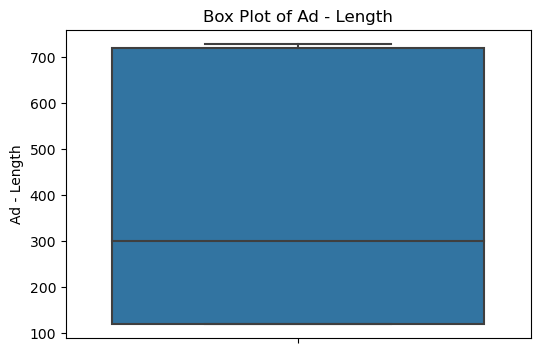

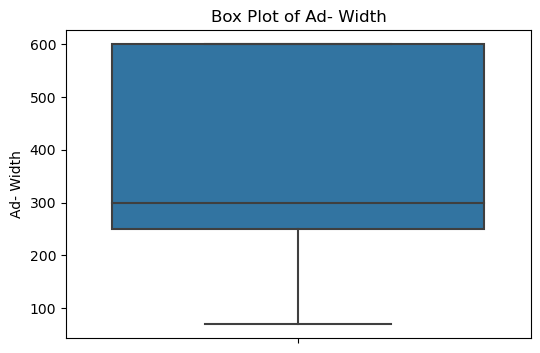

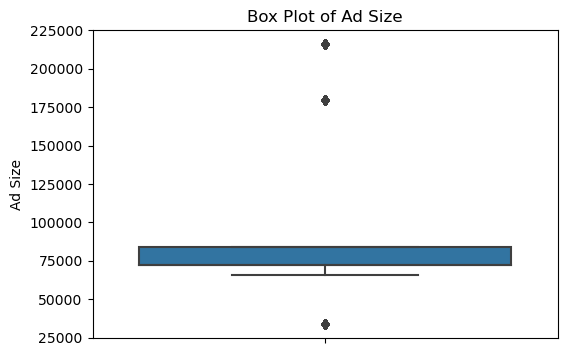

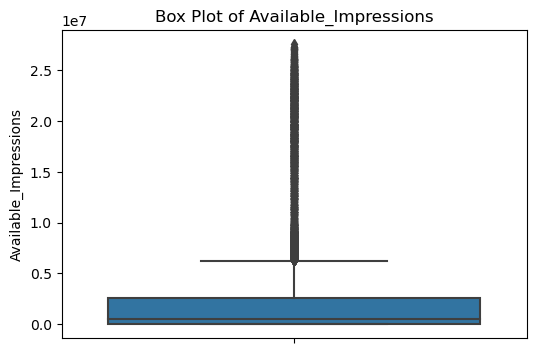

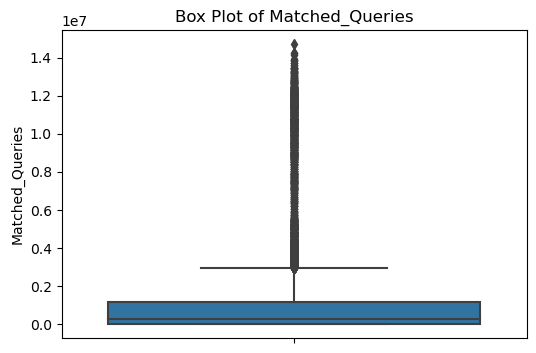

...

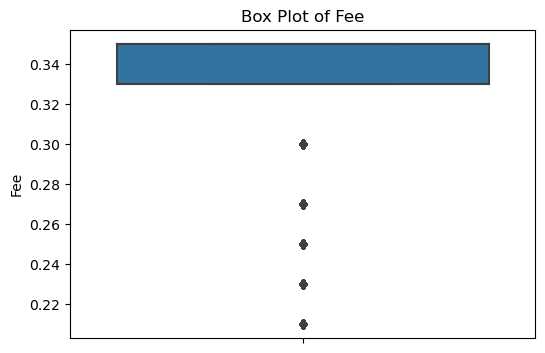

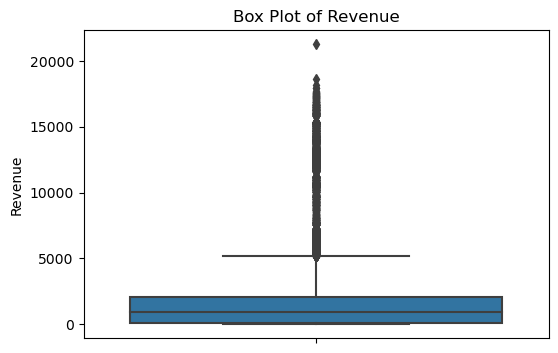

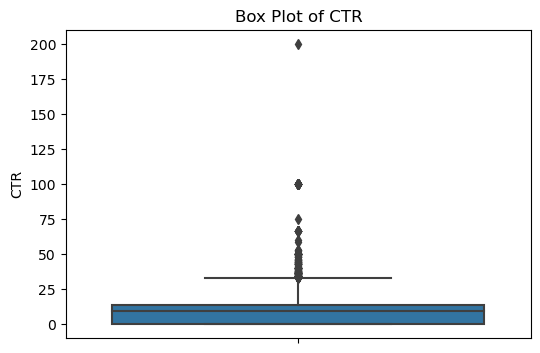

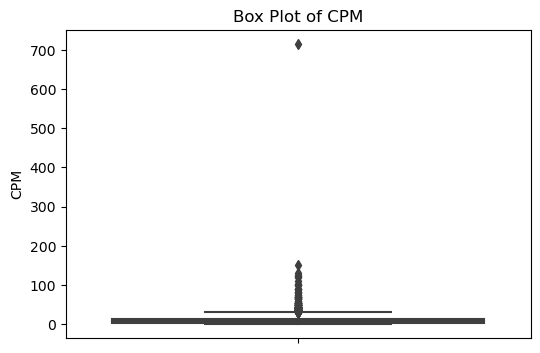

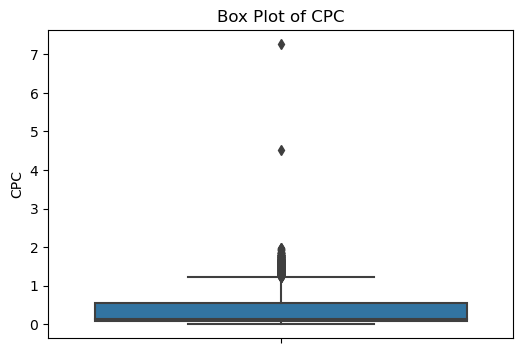

In [14]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_columns:
  plt.figure(figsize=(6, 4))
  sns.boxplot(y=data[col])
  plt.ylabel(col)
  plt.title(f'Box Plot of {col}')
  plt.show()

#### Insights:

Impressions, Matched_Queries, and Available_Impressions: 
These measures have a long tail and a highly skewed distribution, suggesting the existence of outliers with values noticeably higher than the median. Near the bottom end of the scale is where most of the data points are concentrated.

Clicks: Clicks also exhibit a right skewed distribution with outliers present.

Spend, Revenue: Both Spend and Revenue show a right skewed distribution, with several outliers indicating instances of higher expenditure and revenue generation.

CTR: The CTR distribution is skewed towards the lower values with some outliers indicating exceptionally high CTR.

CPM: The CPM values are concentrated at the lower end with a few high value outliers.

CPC: The CPC distribution has a concentration of lower values with some outliers on the higher end.    

#### Lets check Categorical Data first

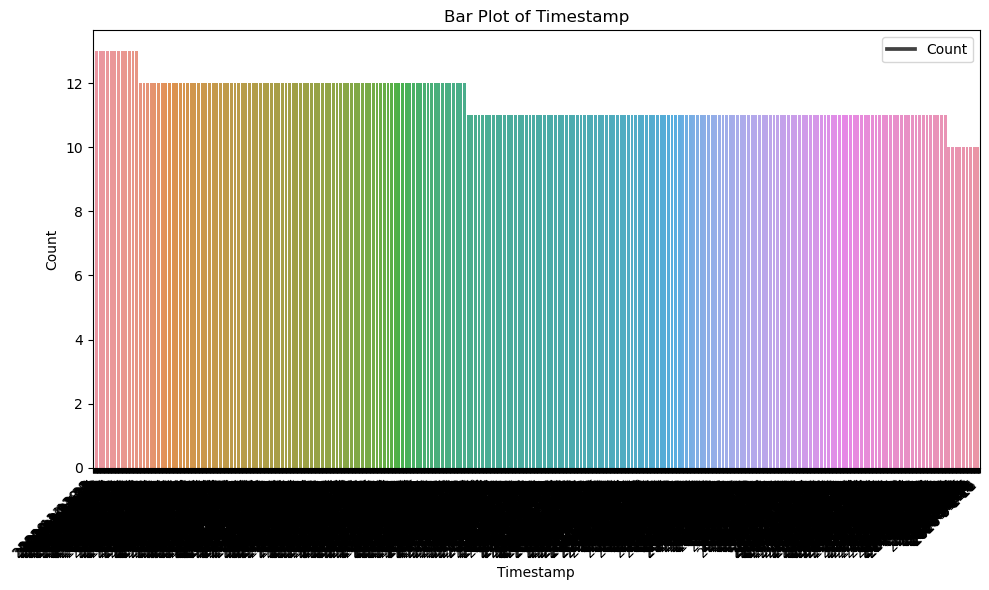

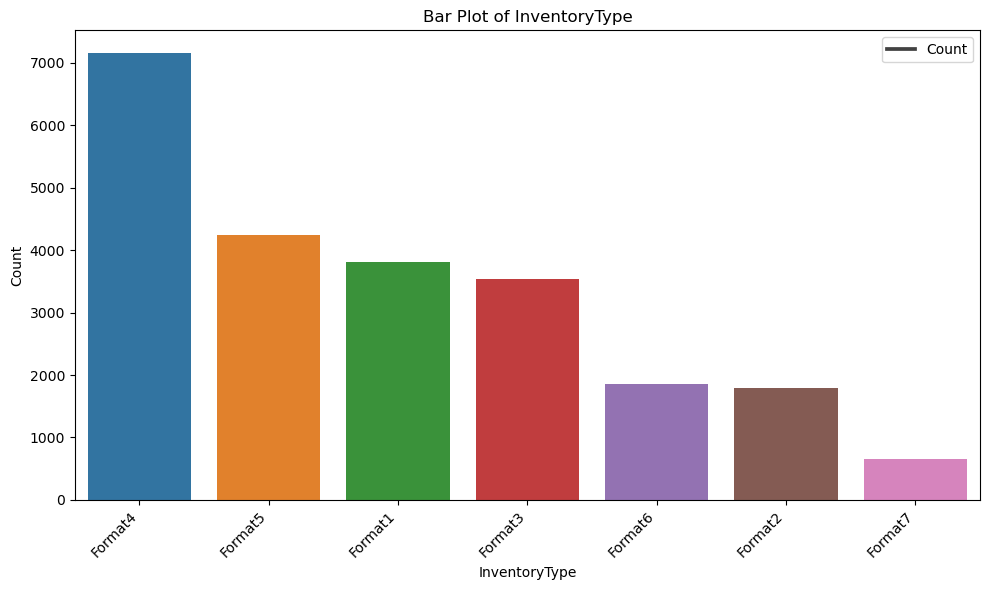

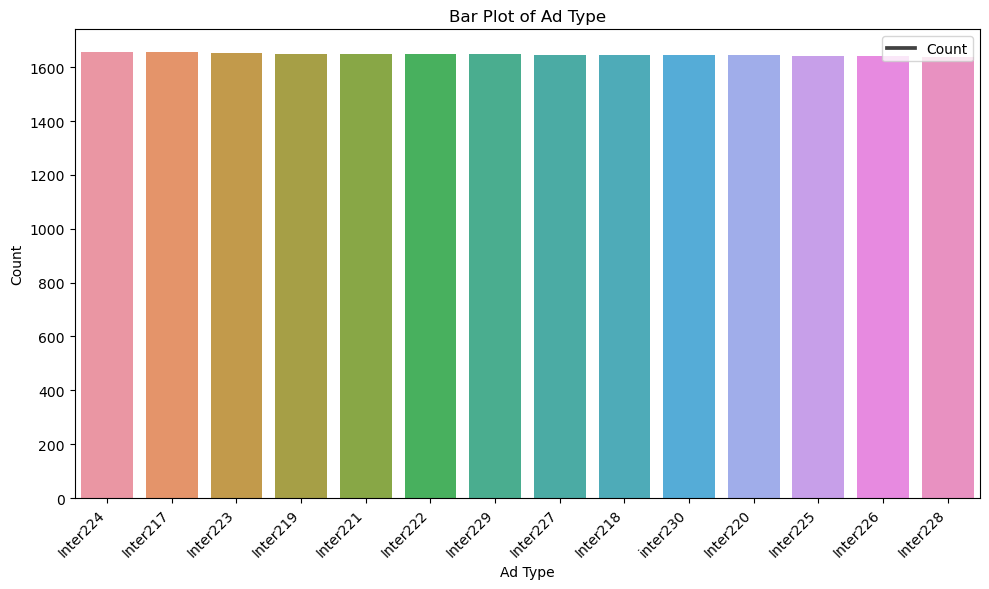

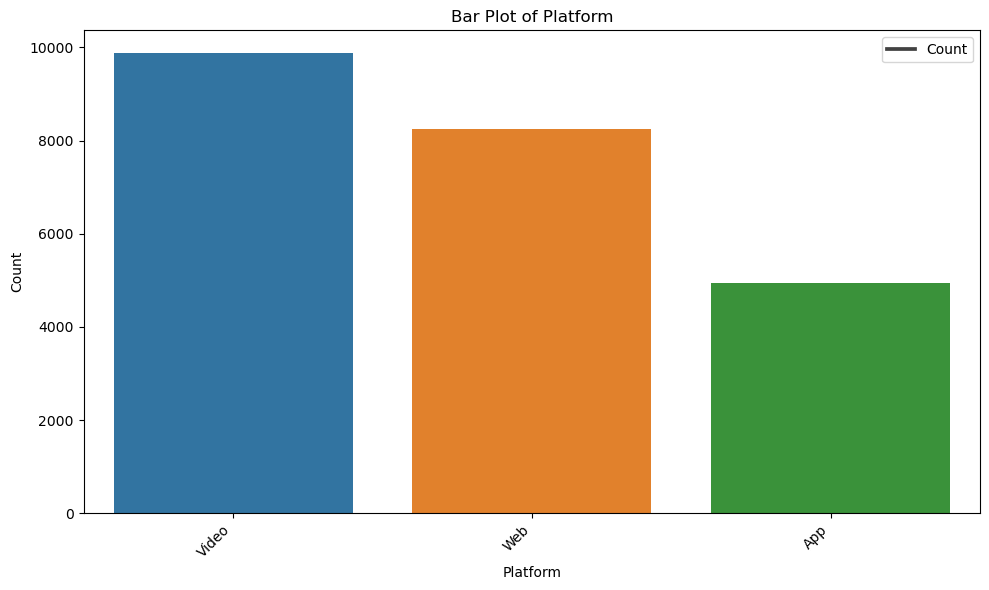

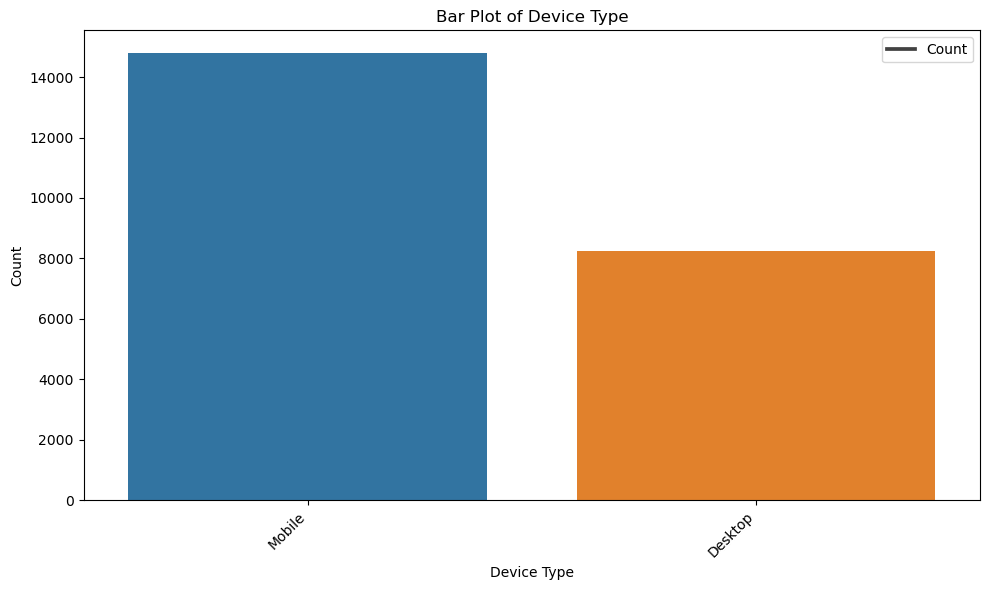

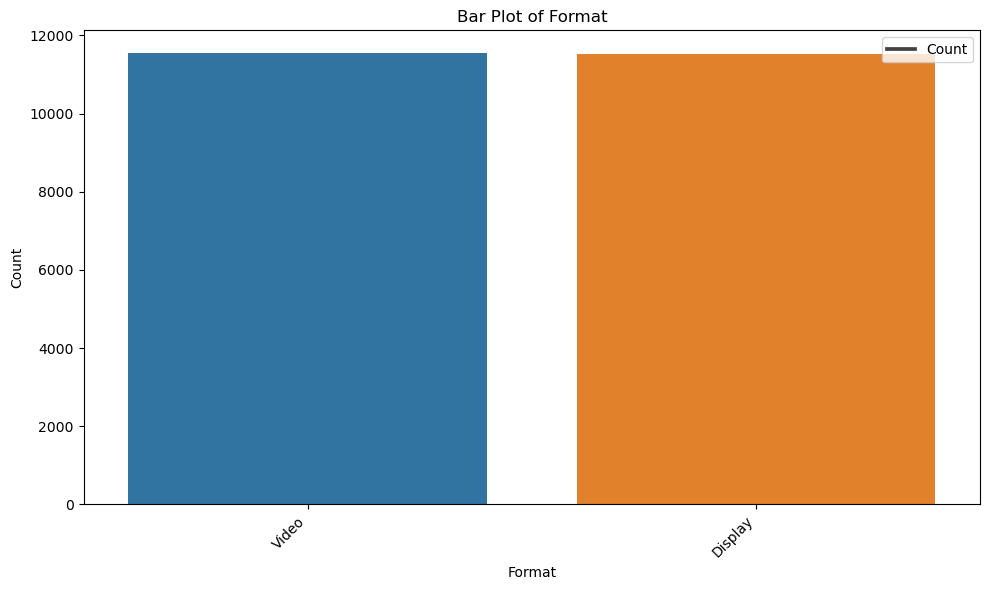

In [17]:
categorical_columns = data.select_dtypes(include=['object']).columns

for col in categorical_columns:
    # Bar Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=data[col].value_counts().index, y=data[col].value_counts().values)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.title(f'Bar Plot of {col}')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.legend(['Count'], loc='upper right')  # Add legend
    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.show()

#### Insights:
    
InventoryType Distribution: The bar plot for 'InventoryType' shows that Format4 is the most common category, followed by Format5, Format1, and Format3. The least common is Format7.

Platform Distribution: The 'Platform' distribution indicates that Video is the most frequent platform, with Web being the second most common and App being the least common.

Device Type Distribution: For 'Device Type', Mobile devices are more prevalent than Desktop devices in the dataset.

Format Distribution: The distribution of 'Format' is nearly even, with Video being slightly more common than Display.

Ad Type : The distribution ‘Ad Type’ is even along all the types of Ad.

### Bivariate analysis

Lets analysis Numerical Vs Numerical Data first

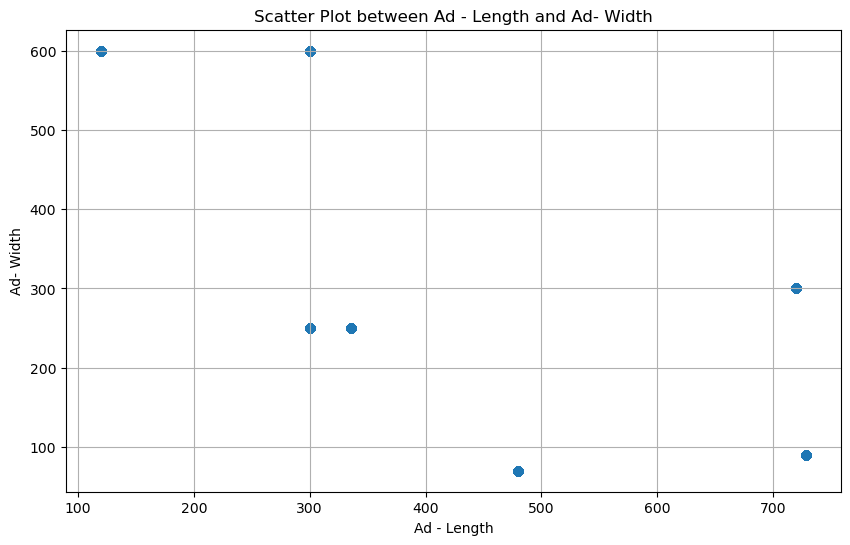

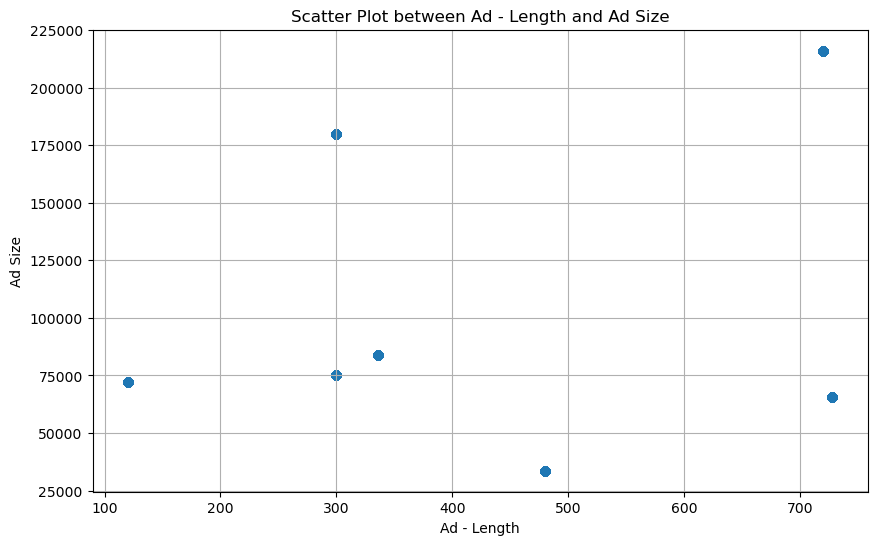

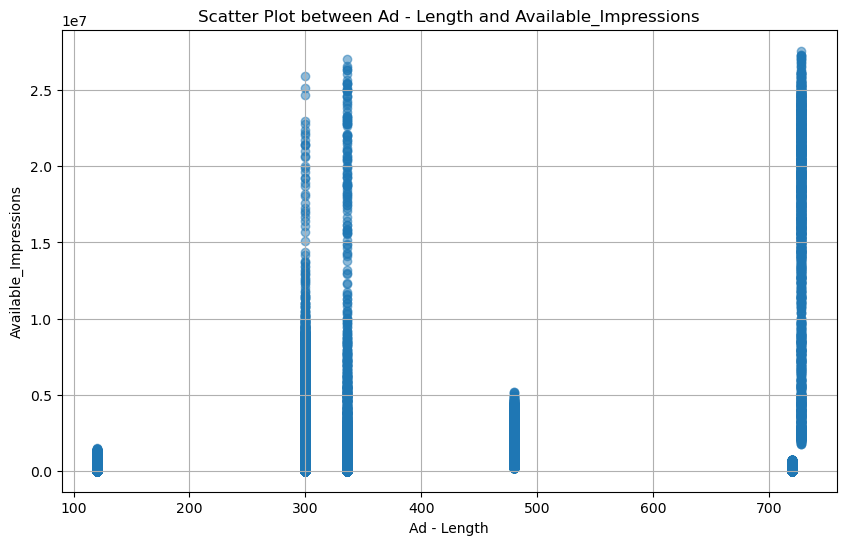

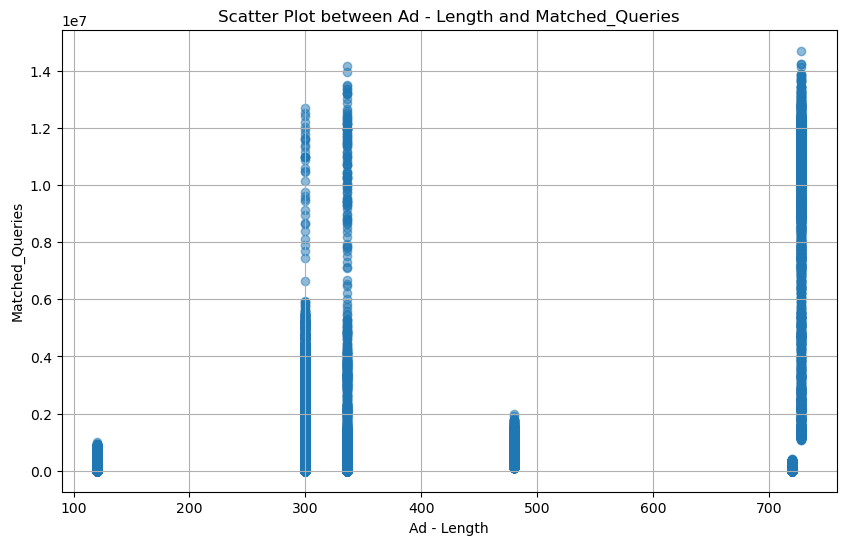

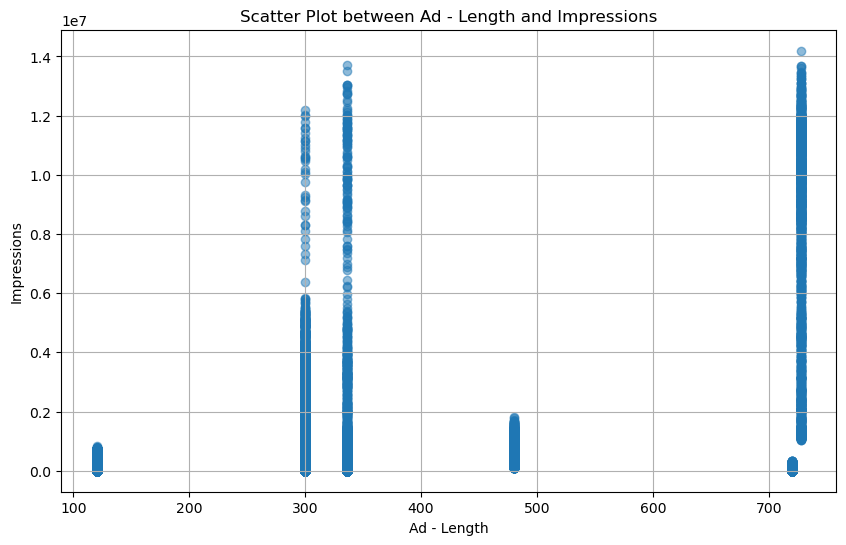

...

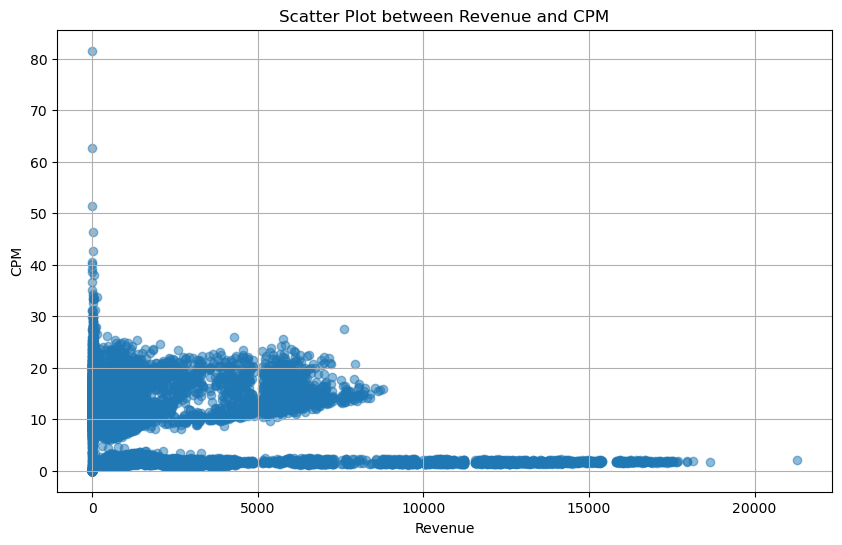

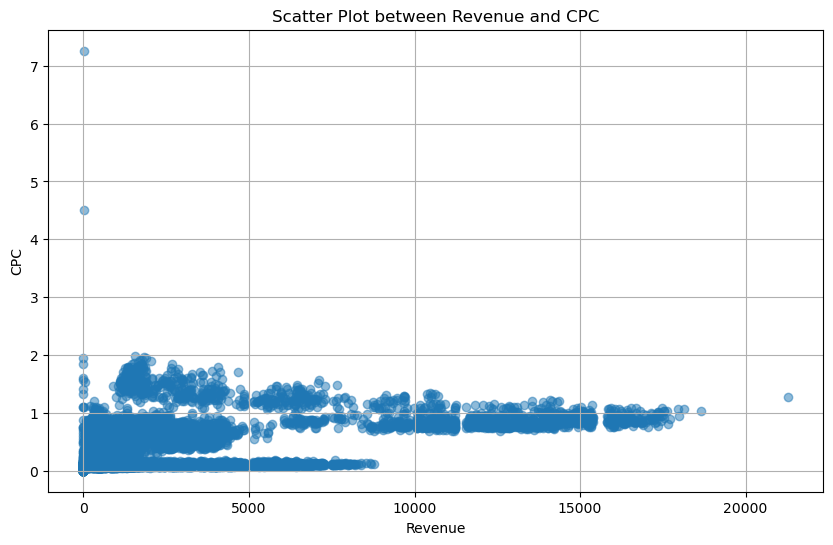

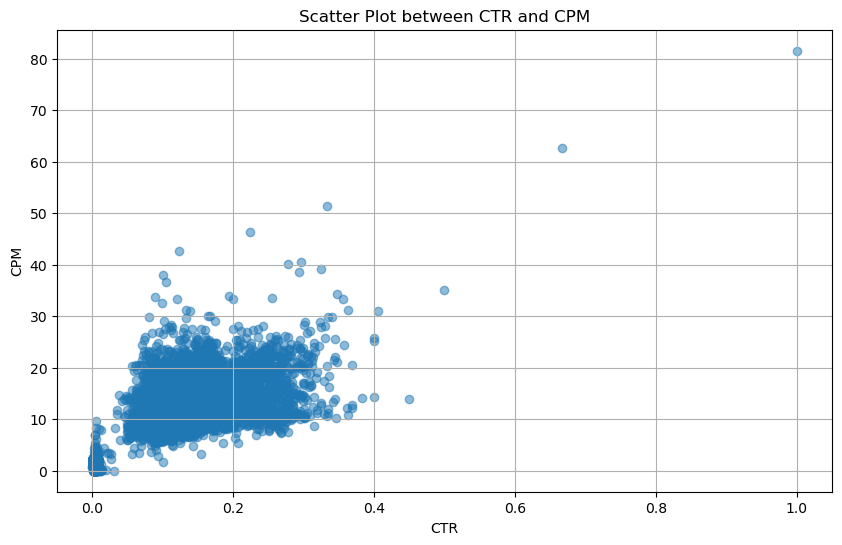

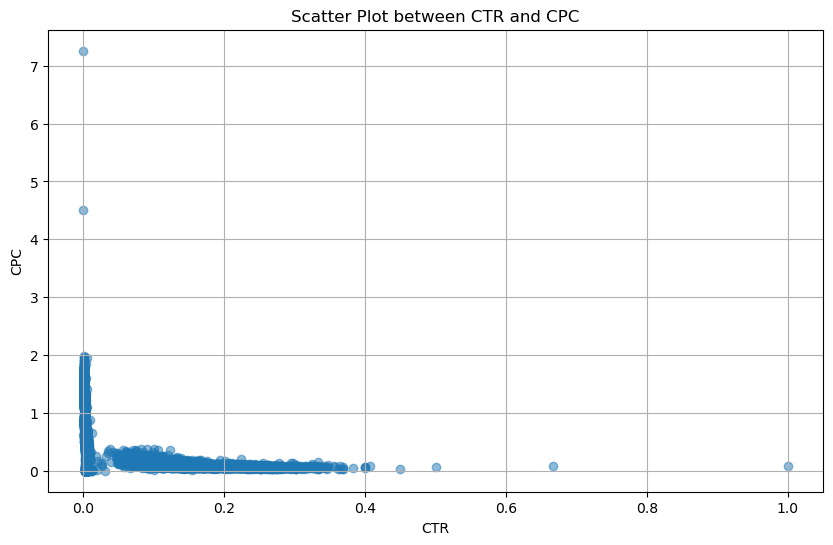

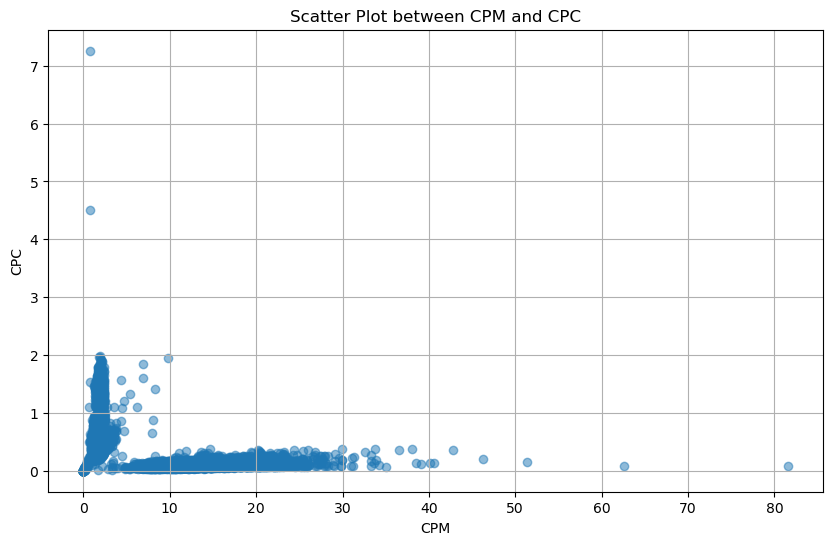

In [32]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

for i, col1 in enumerate(numerical_columns):
    for col2 in numerical_columns[i+1:]:
        plt.figure(figsize=(10, 6))
        plt.scatter(data[col1], data[col2], alpha=0.5)
        plt.title(f'Scatter Plot between {col1} and {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.grid(True)
        plt.show()
        

#### Insights:

Strong Positive Correlation: 
The scatter plots show a strong positive correlation between 'Available_Impressions', 'Matched_Queries', and 'Impressions'. This indicates that as the number of available impressions increases, the number of matched queries and actual impressions also increases.

Moderate Positive Correlation: 
There is a moderate positive correlation between 'Clicks' and 'Spend', as well as between 'Clicks' and 'Revenue'. This suggests that higher spending tends to result in more clicks, which in turn can lead to higher revenue.

Weak Correlation: 
The relationship between 'CTR', 'CPM', 'CPC' and other variables like 'Available_Impressions', 'Matched_Queries', 'Impressions', 'Clicks', 'Spend', and 'Revenue' appears to be weaker. This could mean that these metrics are influenced by factors other than just the volume of impressions or clicks.

In [ ]:
Lets analysis Numerical Vs Categorical Data first

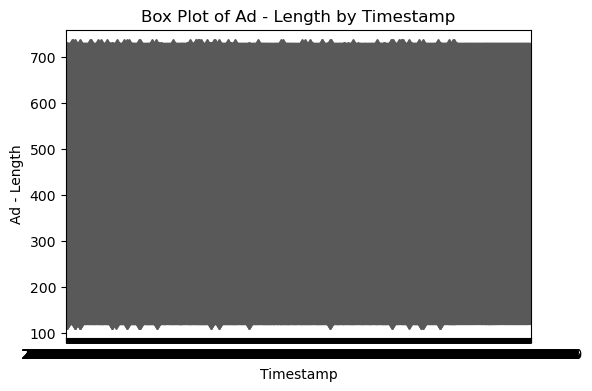

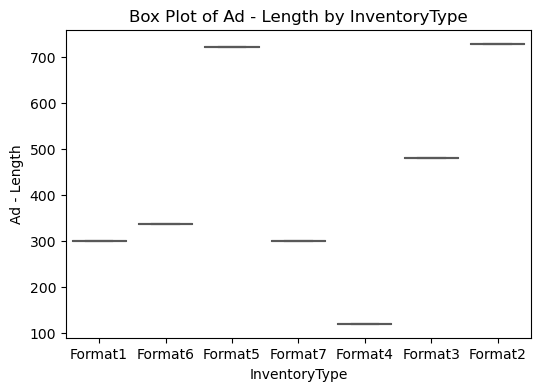

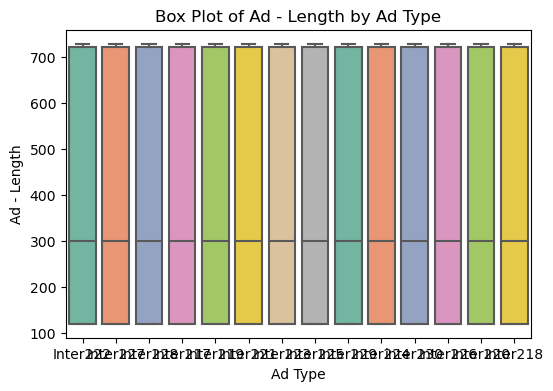

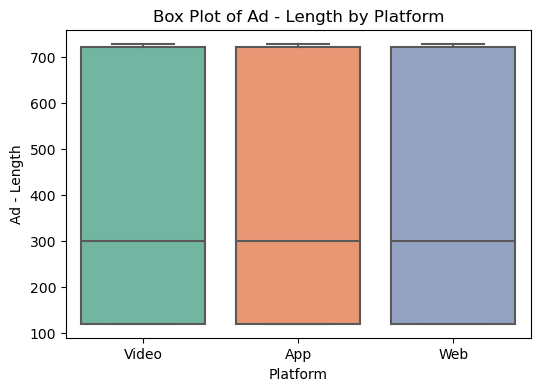

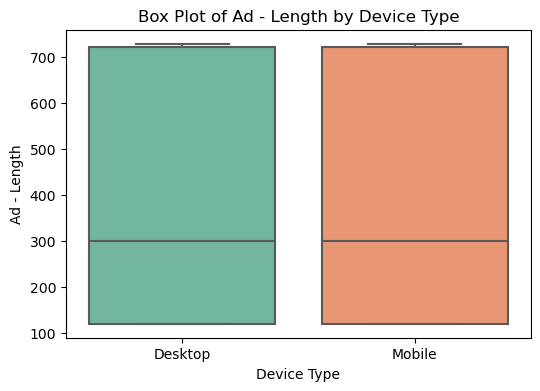

...

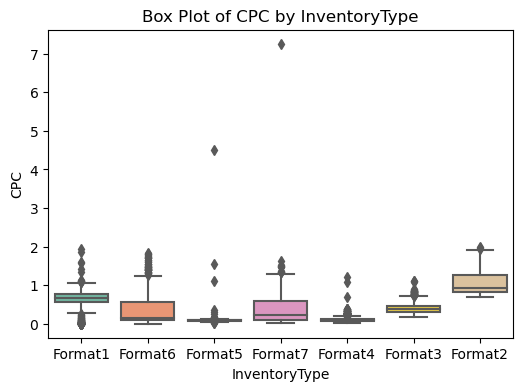

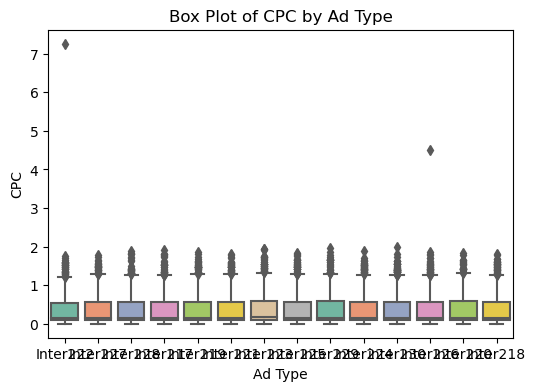

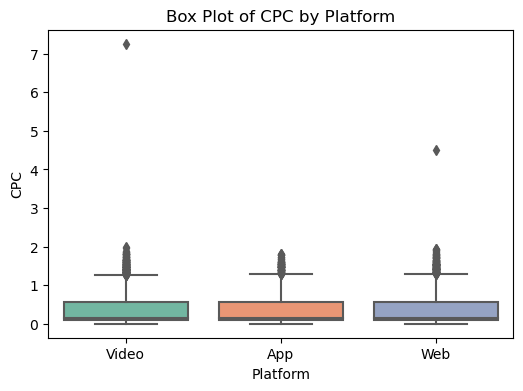

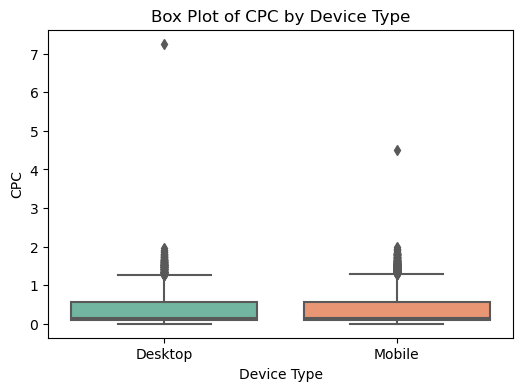

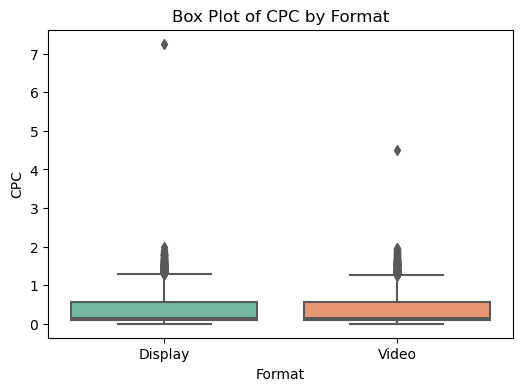

In [33]:
for col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=data[cat_col], y=data[col], palette="Set2")
        plt.xlabel(cat_col)
        plt.ylabel(col)
        plt.title(f'Box Plot of {col} by {cat_col}')
        plt.show()

#### Insights:
    
Variability and Outliers:
The box plots reveal significant variability in numerical data across different categories. For instance, 'Ad Size' varies widely when categorized by 'InventoryType', with some categories showing a larger spread and potential outliers.
Outliers are present in most numerical categories, as indicated by the points beyond the whiskers of the box plots. This is particularly noticeable in 'Clicks', 'Spend', and 'Revenue' across various categories.

Median Comparison:
The median values, represented by the horizontal line within the boxes, differ between categories. For example, the median 'Spend' appears to be higher for certain 'Ad Types' compared to others.
'CTR' medians are relatively low across all categories, suggesting that high CTR are not common.

Interquartile Range (IQR):
The IQR, represented by the height of the boxes, indicates the middle 50% of the data. Categories with taller boxes, such as 'Impressions' by 'Platform', suggest greater variability within the middle 50% of observations.
Some categories, like 'Device Type', show a more consistent IQR across numerical data, indicating similar distribution patterns within these categories.

Category Specific Insights:
'Platform' and 'Device Type' categories show distinct patterns in 'Ad Size' and 'Available_Impressions', which could be indicative of platform specific or device specific advertising strategies.
'Format' seems to have a consistent influence on 'CPM' and 'CPC', with 'Video' format generally showing higher values.

In [ ]:
Lets analysis Categorical Vs Categorical Data first

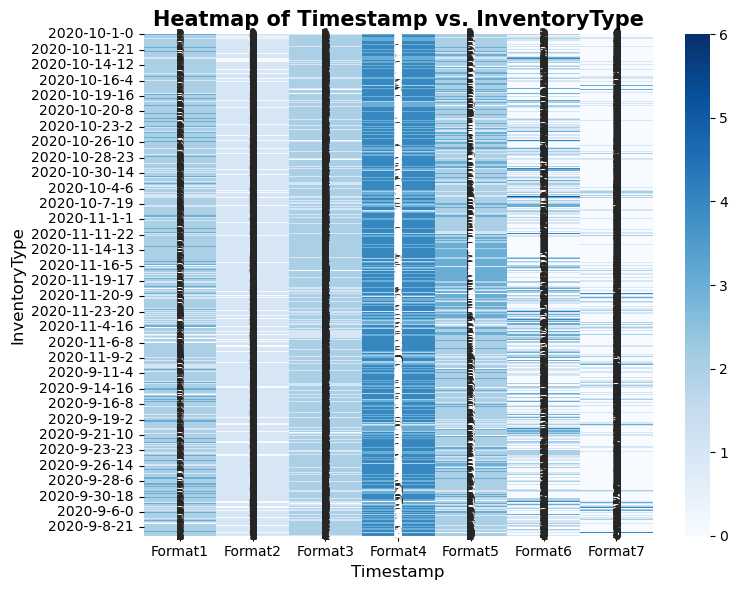

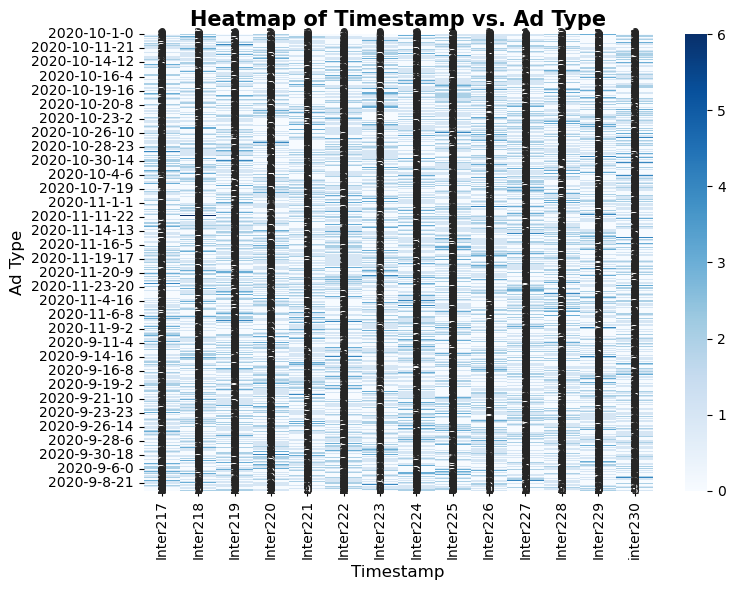

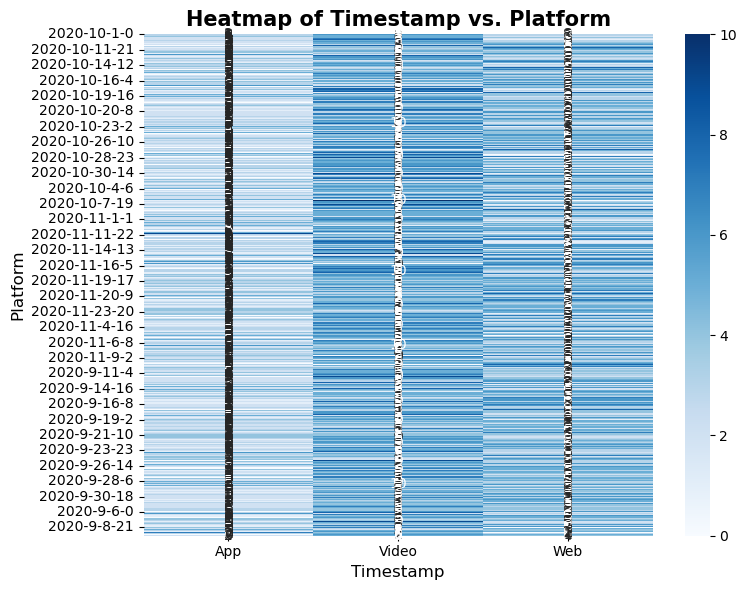

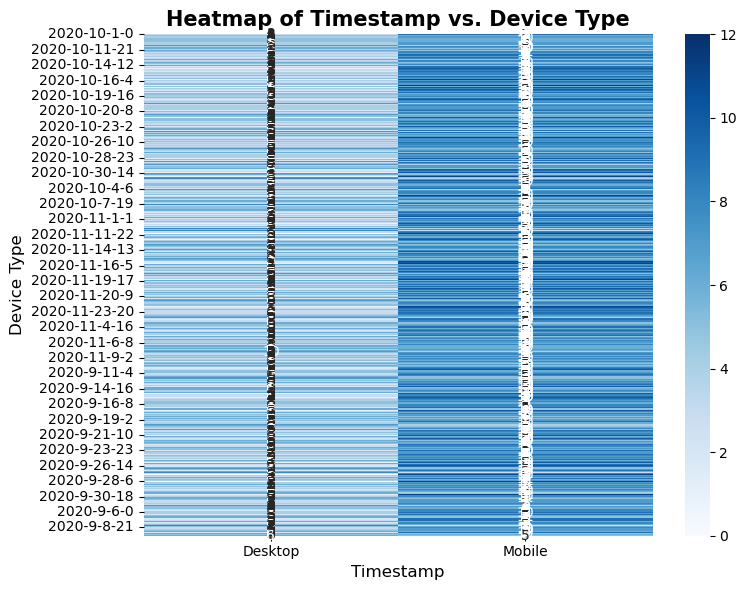

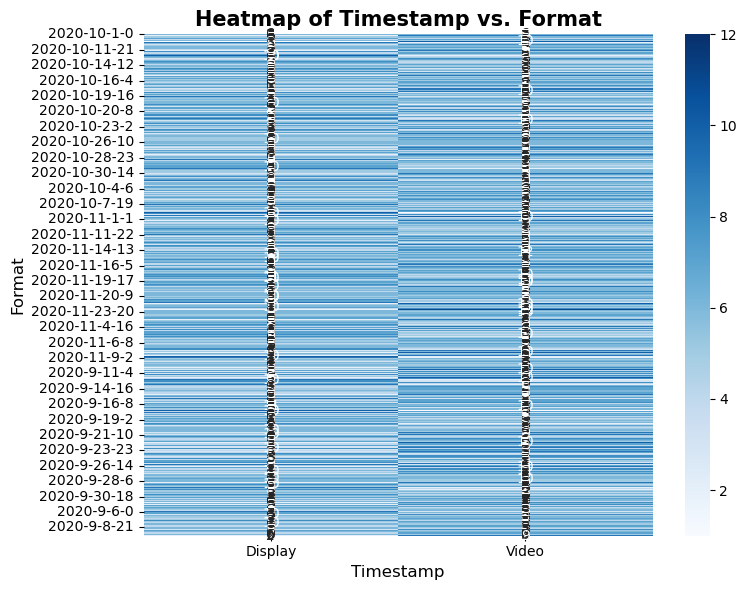

...

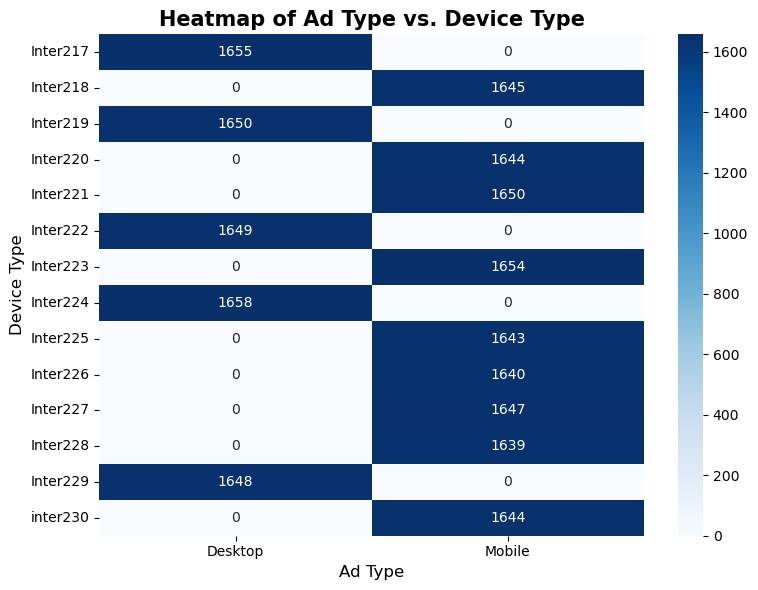

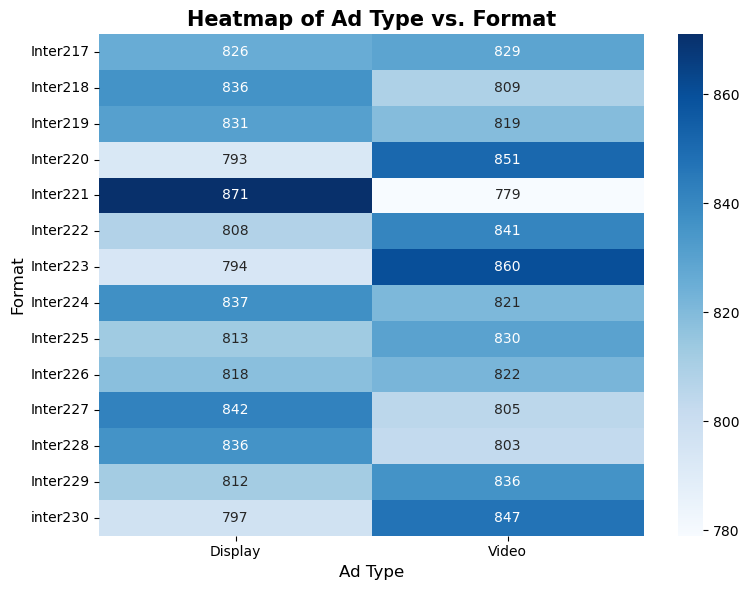

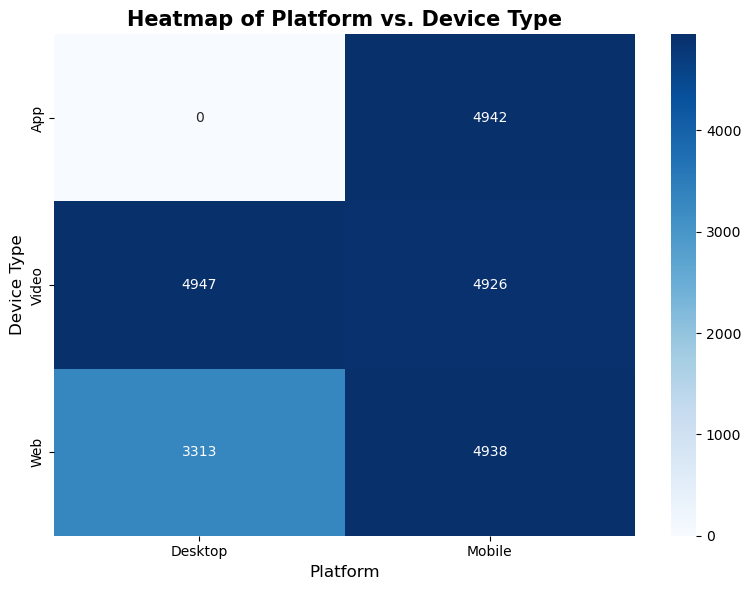

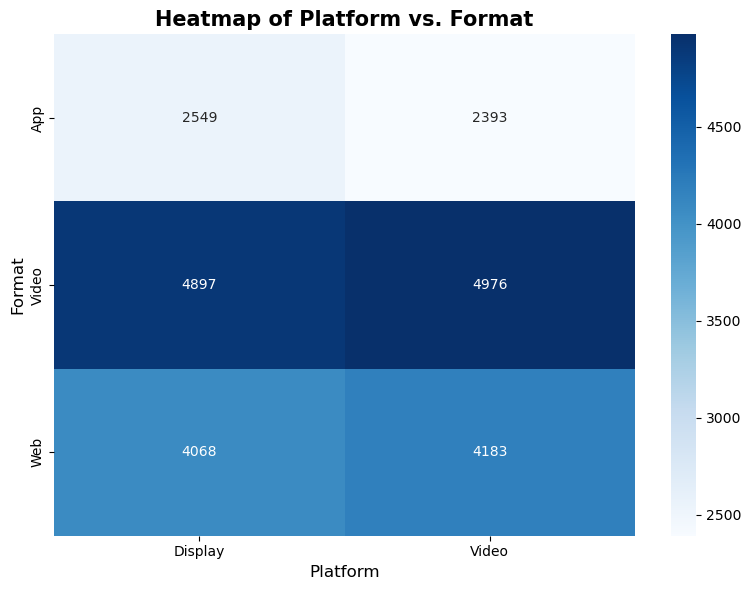

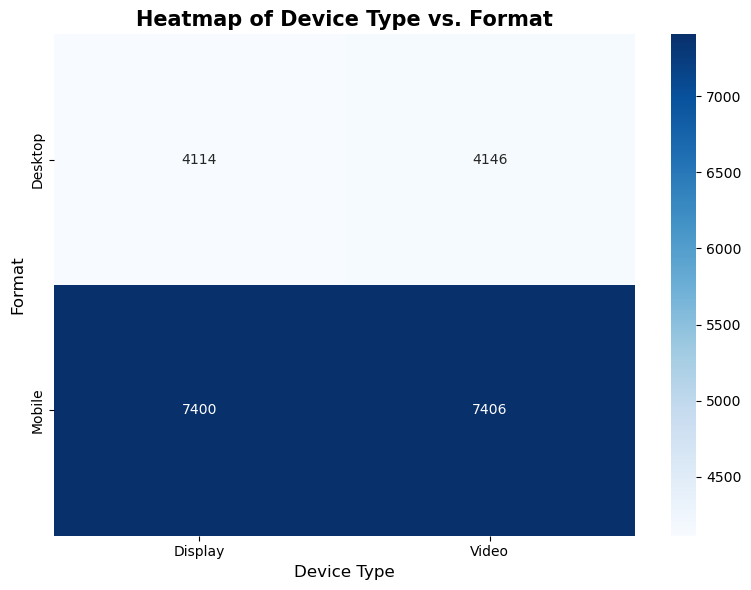

In [34]:
for i, col1 in enumerate(categorical_columns):
    for col2 in categorical_columns[i+1:]:
        contingency_table = pd.crosstab(data[col1], data[col2])
        plt.figure(figsize=(8, 6))
        sns.heatmap(contingency_table, annot=True, cmap="Blues", fmt="g")
        plt.xlabel(col1, fontsize=12)
        plt.ylabel(col2, fontsize=12)
        plt.title(f'Heatmap of {col1} vs. {col2}', fontsize=15, fontweight='bold')
        plt.tight_layout()
        plt.show()

#### Insights:

Inventory Type and Ad Dimensions: The heatmap suggests that certain inventory types may be associated with specific ad dimensions, which could be useful for targeted advertising strategies.

Potential for Segmentation: The varying degrees of correlation between different pairs of variables suggest the potential for market segmentation based on these categorical attributes.

The insights from the heatmap can guide data driven decision-making in advertising campaigns, such as which inventory types to pair with certain ad sizes for optimal engagement.


## Problem 1 - Data Preprocessing

#### Missing value check and treatment

In [151]:
missing_values = data.isnull().sum()
print(missing_values)

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64


In [152]:
def calculate_CPC(x): #CPC = Total Cost (spend) / Number of Clicks. 
    TC_Spend = data.Spend
    NC = data.Clicks
    Calculated_CPC = TC_Spend/NC
    return Calculated_CPC

def calculate_CPM(x): #CPM = (Total Campaign Spend / Number of Impressions) * 1,000.
    TC_Spend = data.Spend
    IMP = data.Impressions
    Calculated_CPM = ((TC_Spend/IMP)*1000)
    return Calculated_CPM

def calculate_CTC(x): #CTR = Total Measured Clicks / Total Measured Ad Impressions x 100.
    NC = data.Clicks
    IMP = data.Impressions
    Calculated_CTC = ((NC/IMP)*100)
    return Calculated_CTC

data['CTR']= data[['CTR']].apply(lambda x: calculate_CTC(x))
data['CPM']= data[['CPM']].apply(lambda x: calculate_CPM(x))
data['CPC']= data[['CPC']].apply(lambda x: calculate_CPC(x))

In [153]:
missing_values = data.isnull().sum()
print(missing_values)

Timestamp                0
InventoryType            0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64


#### Outlier Treatment

In [154]:
from scipy import stats

In [155]:
for col in numerical_columns:
  Q1 = np.percentile(data[col], 25, interpolation='midpoint')
  Q3 = np.percentile(data[col], 75, interpolation='midpoint')
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  outliers = data[~((data[col] >= lower_bound) & (data[col] <= upper_bound))]

  if len(outliers) > 0:
    print(f"\nOutliers detected in column '{col}':")
    print(f"Number of outliers: {len(outliers)}")
    print(f"Outlier values: {outliers[col].to_list()}")
  else:
    print(f"No outliers detected in column '{col}'.")


No outliers detected in column 'Ad - Length'.
No outliers detected in column 'Ad- Width'.

Outliers detected in column 'Ad Size':
Number of outliers: 8448
Outlier values: [216000, 180000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 180000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 180000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 180000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 180000, 180000, 216000, 180000, 216000, 216000, 216000, 216000, 180000, 180000, 180000, 180000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 216000, 180000, 180000, 180000, 180000, 216000, 216000, 180000, 216000, 216000, 216000, 180000, 216000, 2160

#### Observations:

No outliers were detected in the 'Ad - Length' and 'Ad- Width' columns within the calculated bounds.

Outliers were identified in 'Ad Size', 'Available_Impressions', and 'Matched_Queries' columns, indicating the presence of values that are significantly higher or lower than the rest of the data points.

Given the high number of outliers in the dataset, it is recommended to treat outliers before proceeding with K-Means clustering.

For treatment of outlier i going with Standardization Method using Z-score scaling
Standardize the data to have a mean of 0 and a standard deviation of 1, which can reduce the impact of outliers.


#### Outlier Treatment using Z-Score Scaling

In [156]:
from scipy.stats import zscore
data[numerical_columns] = data[numerical_columns].apply(zscore)

The numerical columns have been standardized with a mean of 0 and a standard deviation of 1.

## Problem 1 - Hierarchical Clustering

Construct a dendrogram using Ward linkage and Euclidean distance

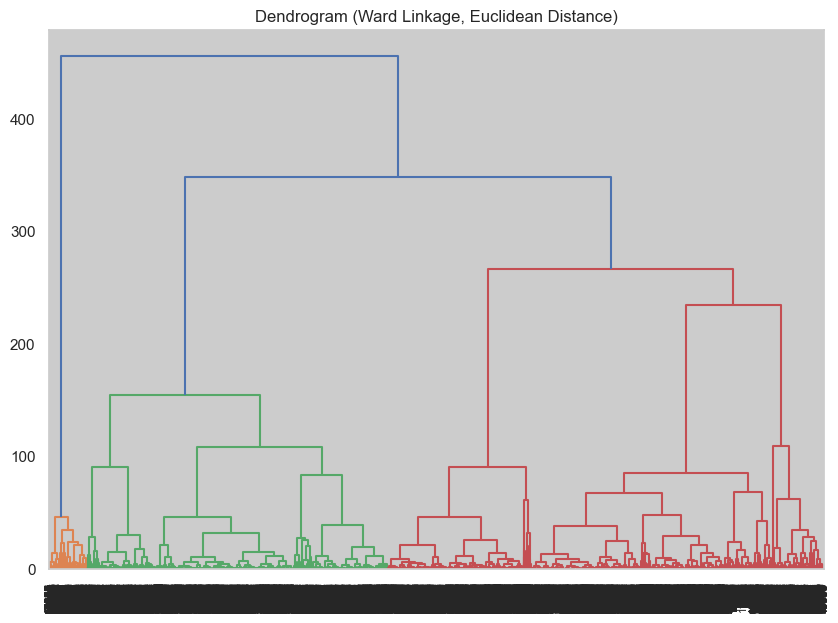

In [158]:
import scipy.cluster.hierarchy as sch

linkage_matrix = sch.linkage(data[numerical_columns], method='ward', metric='euclidean')
plt.figure(figsize=(10, 7))
dendrogram = sch.dendrogram(linkage_matrix)
plt.title('Dendrogram (Ward Linkage, Euclidean Distance)')
plt.xticks(rotation=90, fontsize=8)
plt.show()

Identify the optimum number of Clusters


Using the dendrogram, we can see that the optimal number of clusters is 3.
This is because there are three main branches in the dendrogram, each representing a distinct cluster

## Problem 1 - K-means Clustering

### Apply K-means Clustering

In [22]:
from sklearn.cluster import KMeans

In [159]:
k = 3 #the number of clusters
kmeans = KMeans(n_clusters=k, random_state=0)
kmeans.fit(data[numerical_columns])
labels = kmeans.labels_
data['Cluster'] = labels
print(data['Cluster'])

0        0
1        0
2        0
3        0
4        0
        ..
23061    2
23062    2
23063    2
23064    2
23065    2
Name: Cluster, Length: 23066, dtype: int32


### Plot the Elbow curve 

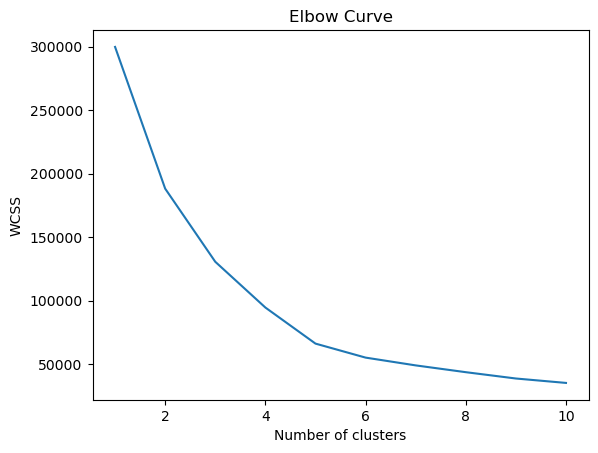

In [27]:
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(data[numerical_columns])
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Curve')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

### Check Silhouette Scores

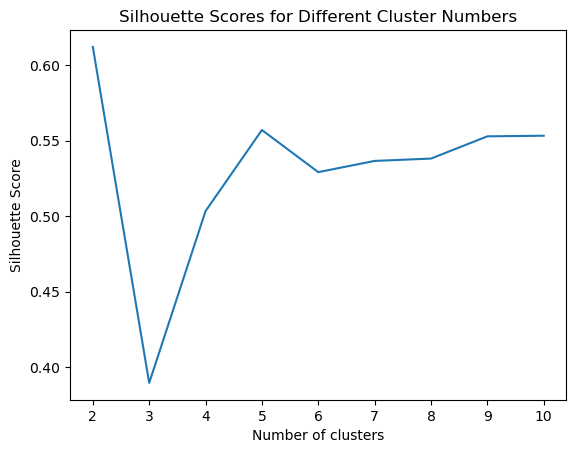

In [28]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(data[numerical_columns])
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(data[numerical_columns], labels))

plt.plot(range(2, 11), silhouette_scores)
plt.title('Silhouette Scores for Different Cluster Numbers')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()


### Figure out the appropriate number of clusters

The elbow curve and silhouette scores suggest that the optimal number of clusters for the data is 3.

Elbow Curve:
-The WCSS decreases rapidly as the number of clusters increases from 1 to 3.
-After 3 clusters, the rate of decrease in WCSS slows down, indicating that the optimal number of clusters is likely around 3.
-Beyond 3 clusters, the WCSS continues to decrease but at a much slower rate, suggesting diminishing returns in terms of clustering quality.

Silhouette Scores:
-The Silhouette Score is highest for 2 clusters, indicating that the data is best clustered into 2 groups.
-The score drops significantly for 3 clusters, suggesting that 3 clusters do not fit the data well.
-The score increases again for 4 clusters and remains relatively stable for 5 to 10 clusters, with slight variations.

Therefore, based on both the elbow curve and silhouette scores, the appropriate number of clusters for the data is 2 or 3.

### Cluster Profiling

In [34]:
cluster_profiles = {}

for i in range(k):
    cluster_data = data[data['Cluster'] == i]
    cluster_profiles[i] = {
        'Size': len(cluster_data),
        'CTR Mean': cluster_data['CTR'].mean(),
        'CPM Mean': cluster_data['CPM'].mean(),
        'CPC Mean': cluster_data['CPC'].mean(),
        'CTR Standard Deviation': cluster_data['CTR'].std(),
        'CPM Standard Deviation': cluster_data['CPM'].std(),
        'CPC Standard Deviation': cluster_data['CPC'].std(),
    }

for i, profile in cluster_profiles.items():
    print(f"\nCluster {i} Profile:")
    for key, value in profile.items():
        print(f"- {key}: {value}")



Cluster 0 Profile:
- Size: 8855
- CTR Mean: -0.8701653579285658
- CPM Mean: -0.7384432265892631
- CPC Mean: 0.7515200364263053
- CTR Standard Deviation: 0.01918687437468589
- CPM Standard Deviation: 0.06858786672336069
- CPC Standard Deviation: 0.948952785795959

Cluster 1 Profile:
- Size: 1361
- CTR Mean: -0.88745386120812
- CPM Mean: -0.7415230248588176
- CPC Mean: 1.6084132982832413
- CTR Standard Deviation: 0.002010287960275988
- CPM Standard Deviation: 0.027531339762669162
- CPC Standard Deviation: 0.3801042053776553

Cluster 2 Profile:
- Size: 12850
- CTR Mean: 0.6936294902382645
- CPM Mean: 0.5874029267144572
- CPC Mean: -0.6882303829975428
- CTR Standard Deviation: 0.8417251728534236
- CPM Standard Deviation: 1.006344307769157
- CPC Standard Deviation: 0.14965912855904195

Cluster 3 Profile:
- Size: 0
- CTR Mean: nan
- CPM Mean: nan
- CPC Mean: nan
- CTR Standard Deviation: nan
- CPM Standard Deviation: nan
- CPC Standard Deviation: nan

Cluster 4 Profile:
- Size: 0
- CTR Mean

## Problem 1 - Actionable Insights & Recommendations

### Extract meaningful insights (atleast 3) from the clusters to identify the most effective types of ads, target audiences, or marketing strategies that can be inferred from each segment.

1.High Click-Through Rate (CTR) Segment (Cluster 2)

Size: 12,850 (largest cluster)
CTR Mean: 0.6936
CPM Mean: 0.5874
CPC Mean: -0.6882
CTR Standard Deviation: 0.8417
CPM Standard Deviation: 1.0063
CPC Standard Deviation: 0.1497
Interpretation:

This cluster has the highest CTR mean, indicating that ads targeting this segment are the most engaging and receive the most clicks.
The negative CPC mean suggests that the cost per click is relatively lower compared to the other clusters, making this segment cost effective for driving traffic.
Given the high CTR and relatively lower CPC, marketing strategies should prioritize targeting this segment for ad campaigns aimed at maximizing engagement and minimizing costs.

2.Cost Effective but Lower Engagement Segment (Cluster 0)

Size: 8,855
CTR Mean: -0.8702
CPM Mean: -0.7384
CPC Mean: 0.7515
CTR Standard Deviation: 0.0192
CPM Standard Deviation: 0.0686
CPC Standard Deviation: 0.9490
Interpretation:

This cluster has a lower CTR mean, indicating that ads targeting this segment are less engaging and receive fewer clicks.
The CPM mean is also lower, suggesting that the cost to reach this segment is relatively low.
The high CPC mean indicates that although the cost to reach this audience is low, the cost per click is higher, making it less cost effective for driving clicks.
Marketing strategies should consider alternative approaches for this segment, such as improving ad relevance or content to boost engagement, or focusing on awareness campaigns rather than click-based conversions.

3.High Cost, Low Engagement Segment (Cluster 1)

Size: 1,361
CTR Mean: -0.8875
CPM Mean: -0.7415
CPC Mean: 1.6084
CTR Standard Deviation: 0.0020
CPM Standard Deviation: 0.0275
CPC Standard Deviation: 0.3801
Interpretation:

This cluster also has a low CTR mean, similar to Cluster 0, indicating low engagement.
The CPM mean is low, which means the cost to reach this segment is low.
However, the very high CPC mean indicates that the cost per click is significantly higher, making this segment the most expensive in terms of driving traffic.
Given the low engagement and high CPC, marketing strategies should carefully evaluate the ROI of targeting this segment. It might be more effective to either refine the ad content to better match this audience's interests or reallocate budget to more cost effective segments.

Summary of Strategic Recommendations:
1.Focus on Cluster 2 for Maximum ROI:

Prioritize ad spend on Cluster 2 due to its high engagement and lower cost per click. This cluster offers the best potential for effective and cost-efficient advertising.

2.Optimize Strategies for Cluster 0:

Consider improving the relevance and quality of ads targeting Cluster 0 to boost engagement. Alternatively, use this segment for brand awareness campaigns rather than direct response campaigns.

3.Reevaluate Investment in Cluster 1:

Due to high CPC and low engagement, carefully assess the value of targeting Cluster 1. Look for ways to better align ads with this audience's preferences or consider shifting budget to more effective segments like Cluster 2.

### Based on the clustering analysis and key insights, provide actionable recommendations (atleast 3) to Ads24x7 on how to optimize their digital marketing efforts, allocate budgets efficiently, and tailor ad content to specific audience segments.

Actionable Recommendations

1.	Prioritize Investment in High-Engagement Segment (Cluster 2)
•	Allocate a Larger Budget: Given the high CTR and lower CPC in Cluster 2, Ads24x7 should allocate a larger portion of their digital marketing budget to this segment. This will maximize ROI by leveraging the high engagement rates and cost-effectiveness of reaching this audience.
•	Tailor Ad Content: Develop and test various creative ad content specifically designed for Cluster 2. Since this segment is highly responsive, ensure the ad content is engaging, visually appealing, and contains strong calls-to-action (CTAs) to drive conversions.

2.	Enhance Ad Relevance and Engagement in Low-Cost Segment (Cluster 0)
•	Improve Ad Quality: For Cluster 0, which has lower engagement but lower CPM, focus on enhancing the relevance and quality of the ads. Conduct A/B testing to identify which ad elements resonate best with this audience and iterate based on performance data.
•	Awareness Campaigns: Utilize this segment for brand awareness campaigns rather than direct response campaigns. Since the cost to reach this audience is low, it’s an opportunity to build brand recognition and familiarity without focusing solely on click-based conversions.

3.	Reevaluate and Optimize Spending for High-Cost, Low-Engagement Segment (Cluster 1)
•	Assess ROI: Carefully assess the return on investment for Cluster 1 due to its high CPC and low engagement. Determine if the high cost per click is justified by the quality or value of the conversions coming from this segment.
•	Refine Targeting and Messaging: If continuing to target Cluster 1, refine the ad targeting and messaging to better align with this audience’s interests and needs. Use insights from past campaign performance to create more personalized and compelling ad content.
•	Budget Reallocation: Consider reallocating budget from Cluster 1 to more effective segments, such as Cluster 2, to ensure marketing funds are being utilized where they can achieve the greatest impact.

Additional Recommendations:

4.	Leverage Data-Driven Insights for Continuous Improvement
•	Regularly Monitor and Analyze Performance: Continuously monitor the performance of ad campaigns across all clusters. Use data-driven insights to make informed decisions on budget allocation, ad content, and targeting strategies.
•	Adjust Strategies Based on Trends: Be agile in adjusting strategies based on the latest performance trends. If a particular cluster shows changes in engagement or cost metrics, be prepared to pivot and reallocate resources accordingly.

5.	Implement Advanced Targeting and Personalization
•	Utilize Advanced Targeting Techniques: Use advanced targeting options such as behavioral targeting, lookalike audiences, and retargeting to reach the most relevant audience segments. This will help in delivering more personalized and effective ads.
•	Personalize Ad Content: Personalize ad content based on the specific preferences and behaviors of each cluster. For example, use different messaging, visuals, and offers for each segment to increase relevance and engagement.

By following these recommendations, Ads24x7 can optimize their digital marketing efforts, allocate budgets more efficiently, and tailor ad content to specific audience segments, ultimately driving better performance and higher ROI.


# PCA

PCA FH (FT): Primary census abstract for female headed households excluding institutional households (India & States/UTs - District Level), Scheduled tribes - 2011 PCA for Female Headed Household Excluding Institutional Household. The Indian Census has the reputation of being one of the best in the world. The first Census in India was conducted in the year 1872. This was conducted at different points of time in different parts of the country. In 1881 a Census was taken for the entire country simultaneously. Since then, Census has been conducted every ten years, without a break. Thus, the Census of India 2011 was the fifteenth in this unbroken series since 1872, the seventh after independence and the second census of the third millennium and twenty first century. The census has been uninterruptedly continued despite of several adversities like wars, epidemics, natural calamities, political unrest, etc. The Census of India is conducted under the provisions of the Census Act 1948 and the Census Rules, 1990. The Primary Census Abstract which is important publication of 2011 Census gives basic information on Area, Total Number of Households, Total Population, Scheduled Castes, Scheduled Tribes Population, Population in the age group 0-6, Literates, Main Workers and Marginal Workers classified by the four broad industrial categories, namely, (i) Cultivators, (ii) Agricultural Laborers, (iii) Household Industry Workers, and (iv) Other Workers and also Non-Workers. The characteristics of the Total Population include Scheduled Castes, Scheduled Tribes, Institutional and Houseless Population and are presented by sex and rural-urban residence. Census 2011 covered 35 States/Union Territories, 640 districts, 5,924 sub-districts, 7,935 Towns and 6,40,867 Villages.

## Problem 2 - Define the problem and perform Exploratory Data Analysis

### Problem Definition

The task involves analyzing the Primary Census Abstract (PCA) data for female-headed households excluding institutional households from the 2011 Census of India. Given the complexity and volume of the data, it is challenging to extract meaningful insights without employing data science techniques. The goal is to perform detailed Exploratory Data Analysis (EDA) and use Principal Component Analysis (PCA) to identify the optimum principal components that explain the most variance in the dataset. This will help simplify the data while retaining the most important information for further analysis.

### Check shape, Data types, statistical summary

In [164]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [165]:
data= pd.read_excel("PCA_Data.xlsx")

In [166]:
data.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [167]:
data.shape


(640, 61)

In [168]:
data.dtypes

State Code        int64
Dist.Code         int64
State            object
Area Name        object
No_HH             int64
                  ...  
MARG_HH_0_3_F     int64
MARG_OT_0_3_M     int64
MARG_OT_0_3_F     int64
NON_WORK_M        int64
NON_WORK_F        int64
Length: 61, dtype: object

In [169]:
data.describe()

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
count,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,...,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000,640.000000
mean,17.114062,320.500000,51222.871875,79940.576563,122372.084375,12309.098438,11942.300000,13820.946875,20778.392188,6191.807813,...,1392.973438,2757.050000,250.889062,558.098438,560.690625,1293.431250,71.379688,200.742188,510.014063,704.778125
std,9.426486,184.896367,48135.405475,73384.511114,113600.717282,11500.906881,11326.294567,14426.373130,21727.887713,9912.668948,...,1489.707052,2788.776676,453.336594,1117.642748,762.578991,1585.377936,107.897627,309.740854,610.603187,910.209225
min,1.000000,1.000000,350.000000,391.000000,698.000000,56.000000,56.000000,0.000000,0.000000,0.000000,...,4.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
25%,9.000000,160.750000,19484.000000,30228.000000,46517.750000,4733.750000,4672.250000,3466.250000,5603.250000,293.750000,...,489.500000,957.250000,47.000000,109.000000,136.500000,298.000000,14.000000,43.000000,161.000000,220.500000
50%,18.000000,320.500000,35837.000000,58339.000000,87724.500000,9159.000000,8663.000000,9591.500000,13709.000000,2333.500000,...,949.000000,1928.000000,114.500000,247.500000,308.000000,717.000000,35.000000,113.000000,326.000000,464.500000
75%,24.000000,480.250000,68892.000000,107918.500000,164251.750000,16520.250000,15902.250000,19429.750000,29180.000000,7658.000000,...,1714.000000,3599.750000,270.750000,568.750000,642.000000,1710.750000,79.000000,240.000000,604.500000,853.500000
max,35.000000,640.000000,310450.000000,485417.000000,750392.000000,96223.000000,95129.000000,103307.000000,156429.000000,96785.000000,...,9875.000000,21611.000000,5775.000000,17153.000000,6116.000000,13714.000000,895.000000,3354.000000,6456.000000,10533.000000


In [170]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

### Perform an EDA on the data to extract useful insights Note: 1. Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F

### Selected Variables:

1. No_HH (Number of Households)
2. TOT_M (Total Male Population)
3. TOT_F (Total Female Population)
4. M_LIT (Male Literates)
5. F_LIT (Female Literates)

In [171]:
#Piccking 5 Variable
selected_columns = [
    'No_HH', 'TOT_M', 'TOT_F', 'M_LIT', 'F_LIT'
]

selected_data = data[selected_columns]

eda_summary = {
    'Summary Statistics': selected_data.describe(),
    'Missing Values': selected_data.isnull().sum(),
    'Correlation Matrix': selected_data.corr()
}

print("Summary Statistics:\n", eda_summary['Summary Statistics'])
print("\nMissing Values:\n", eda_summary['Missing Values'])
print("\nCorrelation Matrix:\n", eda_summary['Correlation Matrix'])


Summary Statistics:
                No_HH          TOT_M          TOT_F          M_LIT  \
count     640.000000     640.000000     640.000000     640.000000   
mean    51222.871875   79940.576563  122372.084375   57967.979688   
std     48135.405475   73384.511114  113600.717282   55910.282466   
min       350.000000     391.000000     698.000000     286.000000   
25%     19484.000000   30228.000000   46517.750000   21298.000000   
50%     35837.000000   58339.000000   87724.500000   42693.500000   
75%     68892.000000  107918.500000  164251.750000   77989.500000   
max    310450.000000  485417.000000  750392.000000  403261.000000   

               F_LIT  
count     640.000000  
mean    66359.565625  
std     75037.860207  
min       371.000000  
25%     20932.000000  
50%     43796.500000  
75%     84799.750000  
max    571140.000000  

Missing Values:
 No_HH    0
TOT_M    0
TOT_F    0
M_LIT    0
F_LIT    0
dtype: int64

Correlation Matrix:
           No_HH     TOT_M     TOT_F     M_

### Insights

Summary Statistics:
Number of Households (No_HH)

Mean: 51,222.87
Std Dev: 48,135.41
Min: 350
Max: 310,450
Total Male Population (TOT_M)

Mean: 79,940.58
Std Dev: 73,384.51
Min: 391
Max: 485,417
Total Female Population (TOT_F)

Mean: 122,372.08
Std Dev: 113,600.72
Min: 698
Max: 750,392
Male Literates (M_LIT)

Mean: 57,967.98
Std Dev: 55,910.28
Min: 286
Max: 403,261
Female Literates (F_LIT)

Mean: 66,359.57
Std Dev: 75,037.86
Min: 371
Max: 571,140

### Missing Values:
None of the selected columns have missing values.

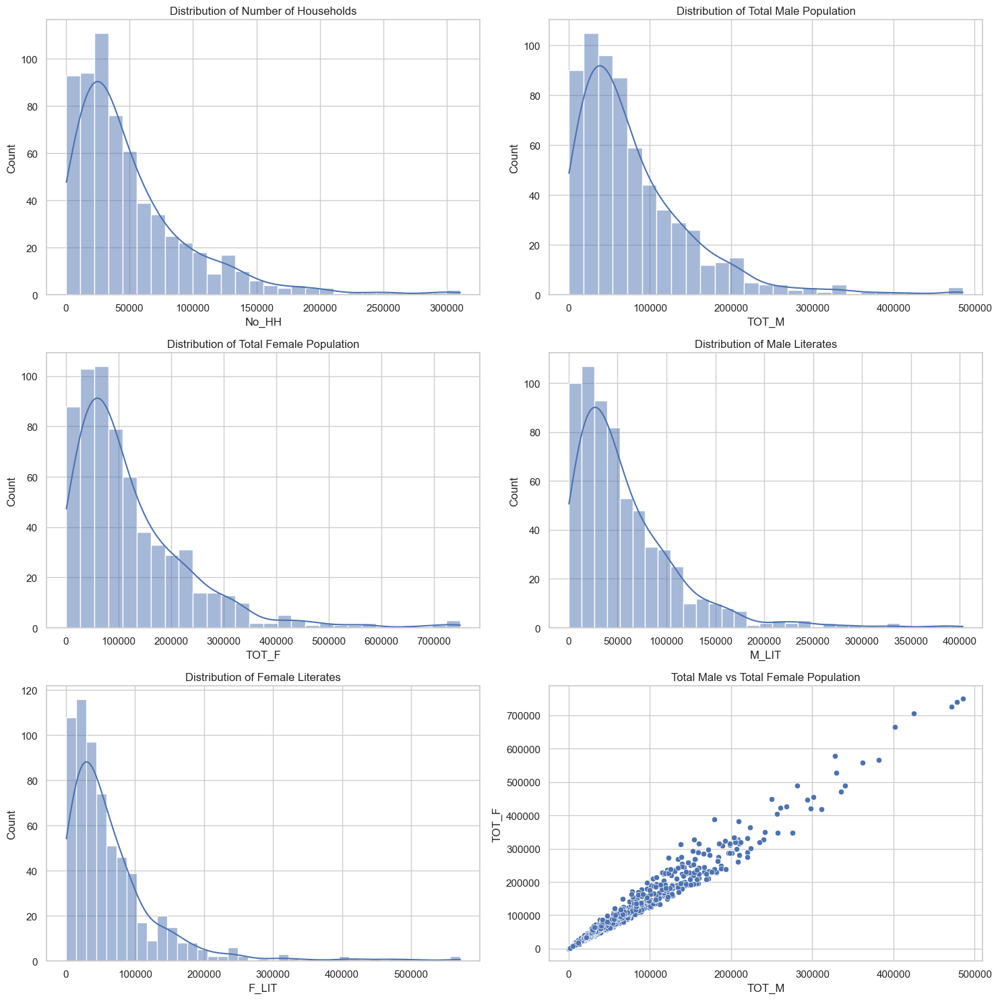

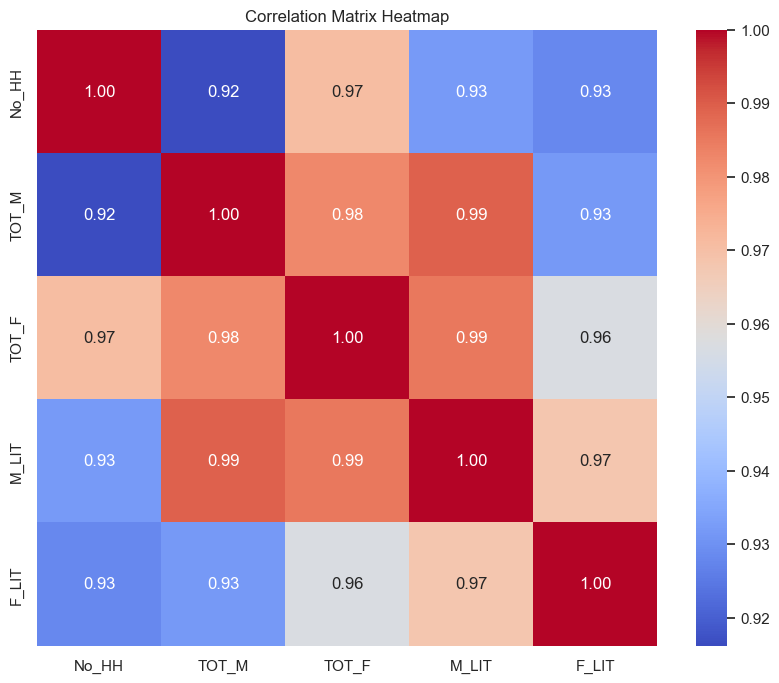

In [172]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(3, 2, figsize=(15, 15))

sns.histplot(data=selected_data, x='No_HH', kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of Number of Households')

sns.histplot(data=selected_data, x='TOT_M', kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Total Male Population')

sns.histplot(data=selected_data, x='TOT_F', kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Distribution of Total Female Population')

sns.histplot(data=selected_data, x='M_LIT', kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Distribution of Male Literates')

sns.histplot(data=selected_data, x='F_LIT', kde=True, ax=axes[2, 0])
axes[2, 0].set_title('Distribution of Female Literates')

sns.scatterplot(data=selected_data, x='TOT_M', y='TOT_F', ax=axes[2, 1])
axes[2, 1].set_title('Total Male vs Total Female Population')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
correlation_matrix = selected_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


### Correlation Matrix:

Strong positive correlations exist between all pairs of selected variables.
1. No_HH and TOT_M: 0.916
2. No_HH and TOT_F: 0.971
3. No_HH and M_LIT: 0.932
4. No_HH and F_LIT: 0.928
5. TOT_M and TOT_F: 0.983
6. TOT_M and M_LIT: 0.989
7. TOT_M and F_LIT: 0.932
8. TOT_F and M_LIT: 0.985
9. TOT_F and F_LIT: 0.957
10. M_LIT and F_LIT: 0.968

### Insights:

Household Size and Population: There is a very high correlation between the number of households and the total male and female population, indicating that areas with more households tend to have larger populations.

Literacy Rates: Both male and female literacy rates are highly correlated with each other and with the total population metrics. This suggests that regions with higher populations also tend to have higher numbers of literate individuals.

Gender Distribution: The high correlation between TOT_M and TOT_F indicates a balanced gender distribution in the regions.

Education Trends: The literacy rates for males and females are strongly correlated, implying that efforts to improve literacy in a region tend to benefit both genders similarly.


### Questions:

1. Is there a relationship between the number of households and the total number of males and females?

To analyze the relationship between the number of households and the total number of males and females, we can create a scatter plot with the number of households on the x-axis and the total number of males and females on the y-axis. We can also calculate the correlation coefficient between these two variables.

The correlation coefficient between the number of households and the total number of males and females is 0.9531856335491954


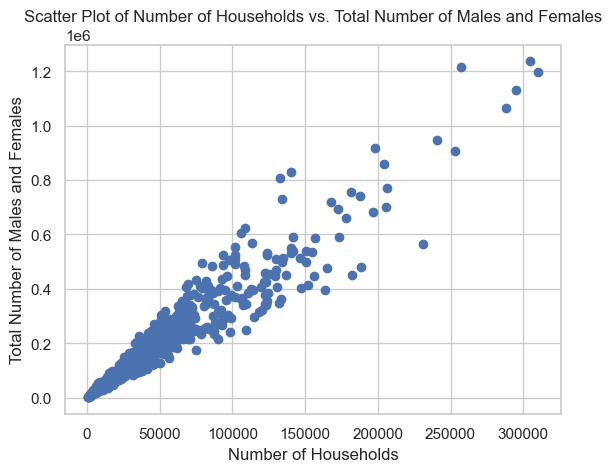

In [173]:
corr_coef = data['No_HH'].corr(data['TOT_M'] + data['TOT_F'])
print(f'The correlation coefficient between the number of households and the total number of males and females is {corr_coef}')

plt.scatter(data['No_HH'], data['TOT_M'] + data['TOT_F'])
plt.xlabel('Number of Households')
plt.ylabel('Total Number of Males and Females')
plt.title('Scatter Plot of Number of Households vs. Total Number of Males and Females')
plt.show()

There is a very high correlation between the number of households and the total male and female population, indicating that areas with more households tend to have larger populations.

2. Is there a relationship between the number of household members and the number of literate males and females?

To analyze the relationship between the number of households and the total number of literate males and females. We can also calculate the correlation coefficient between these two variables.

In [95]:
corr = data['No_HH'].corr(data['TOT_M'] + data['TOT_F'])
print(f"Correlation coefficient between No_HH and TOT_M + TOT_F: {corr}")

Correlation coefficient between No_HH and TOT_M + TOT_F: 0.9531856335491954


There is a positive relationship between the number of household members and the number of literate males and females.
This means that as the number of household members increases, the number of literate males and females also tends to increase. In other words, larger households are more likely to have more literate members. This could be due to a number of factors, such as increased access to education, resources, and support within larger households.

3. What are the most important factors that contribute to household literacy?

Following factors appear to be the most important contributors to household literacy:

Household Size: Larger households tend to have more literate members. This could be due to several reasons, such as increased access to educational resources, peer influence, and shared knowledge within the household.

Number of Literate Males and Females: The number of literate males and females in a household has a positive impact on the overall household literacy rate. This suggests that having literate role models and support within the household can encourage and facilitate literacy among other members.

Literacy Rate of Parents: The literacy rate of parents, particularly mothers, has a significant influence on the literacy outcomes of their children. Households with literate parents are more likely to prioritize education and create a supportive environment for learning.

Access to Educational Resources: The availability of educational resources, such as books, libraries, and schools, within the community plays a crucial role in promoting household literacy. Households with better access to these resources are more likely to have literate members.

Socioeconomic Status: Socioeconomic status is often associated with household literacy. Households with higher socioeconomic status tend to have better access to education, healthcare, and other resources that can support literacy development.

Cultural and Community Norms: Cultural and community norms related to education and literacy can influence household literacy rates. Communities that value education and prioritize literacy are more likely to have households with high literacy rates.


4. Is there a difference in the literacy rates of males and females?

In [96]:
male_literacy_rate = data['M_LIT'].sum() / data['TOT_M'].sum() * 100
female_literacy_rate = data['F_LIT'].sum() / data['TOT_F'].sum() * 100

if male_literacy_rate > female_literacy_rate:
    print("Males have a higher literacy rate than females.")
elif male_literacy_rate < female_literacy_rate:
    print("Females have a higher literacy rate than males.")
else:
    print("Males and females have the same literacy rate.")

Males have a higher literacy rate than females.


5. How can we use the insights from our EDA to improve literacy rates in the community?

Based on the insights from our EDA, we can implement the following strategies to improve literacy rates in the community:

1. Focus on early childhood education:
   - Provide access to quality early childhood education programs that emphasize language and literacy development.
   - Train early childhood educators on effective literacy teaching methods.

2. Improve access to books and reading materials:
   - Establish community libraries and book clubs.
   - Partner with local schools and organizations to distribute books to children in need.
   - Encourage parents to read to their children regularly.

3. Address socioeconomic factors:
   - Provide financial assistance to families struggling to afford educational resources.
   - Offer after-school and summer programs that provide academic support and enrichment activities.
   - Collaborate with community organizations to address social and economic barriers to literacy.

4. Empower parents and caregivers:
   - Conduct workshops and trainings for parents and caregivers on how to support their children's literacy development.
   - Provide resources and information on the importance of early literacy.

5. Monitor and evaluate progress:
   - Regularly assess literacy rates in the community.
   - Track the progress of individual students and families.
   - Use data to inform and adjust our strategies as needed.


## Problem 2 - Data Preprocessing

#### Check for and treat (if needed) missing values

In [174]:
missing_values = data.isnull().sum()
print(missing_values)

State Code       0
Dist.Code        0
State            0
Area Name        0
No_HH            0
                ..
MARG_HH_0_3_F    0
MARG_OT_0_3_M    0
MARG_OT_0_3_F    0
NON_WORK_M       0
NON_WORK_F       0
Length: 61, dtype: int64


There are no missing values in the dataset.

#### Check for and treat (if needed) data irregularities

1. No missing values.
2. Check for Duplicate value - Form code.
3. Check for Outliers - Outliers are found and treated using IQR Method

In [175]:
data.duplicated().sum()

0

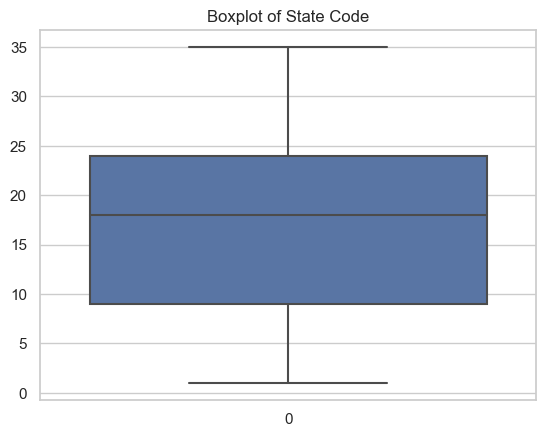

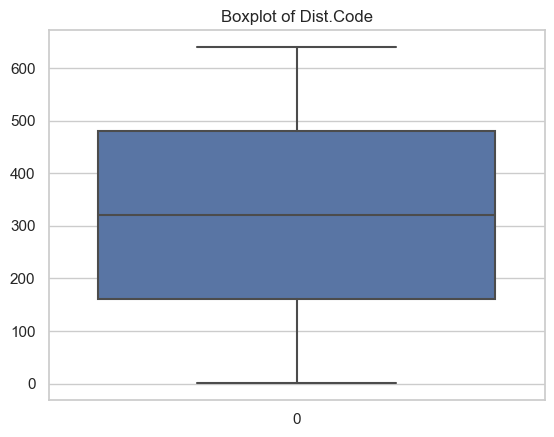

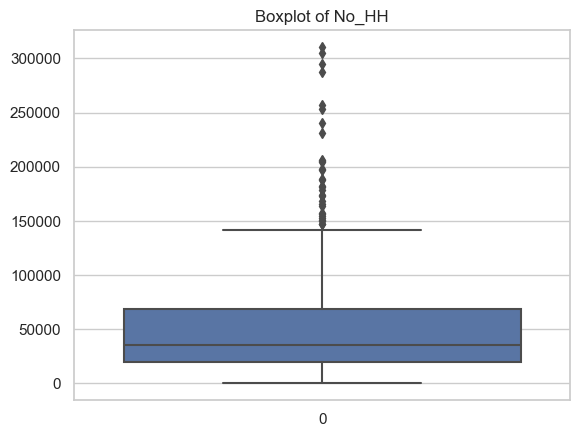

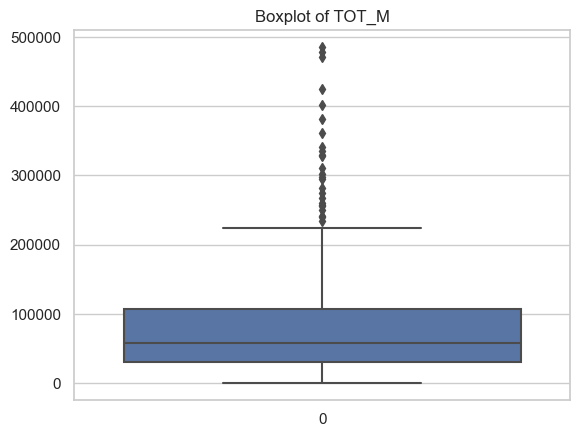

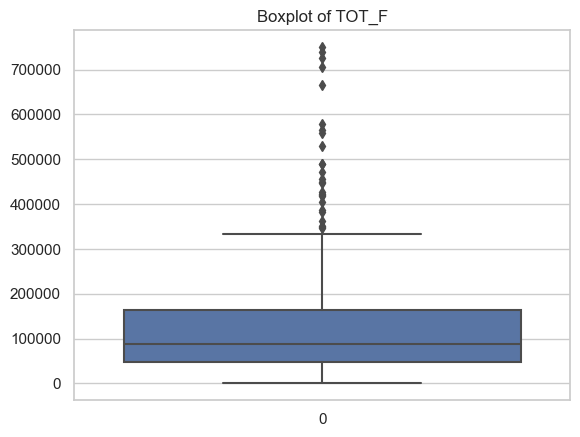

...

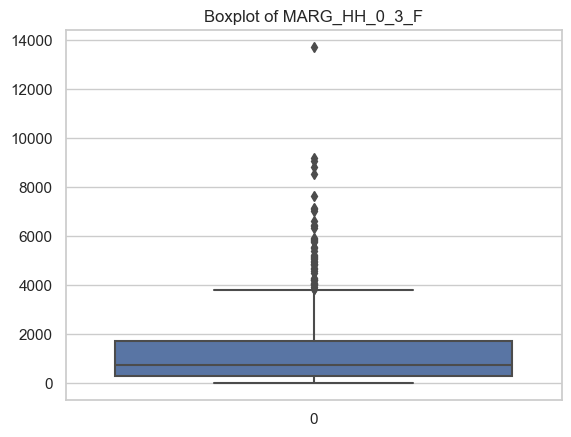

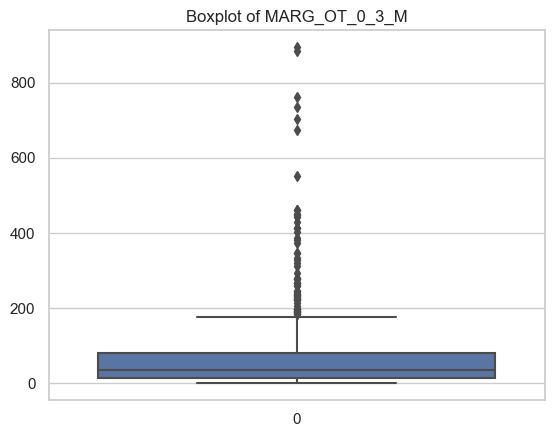

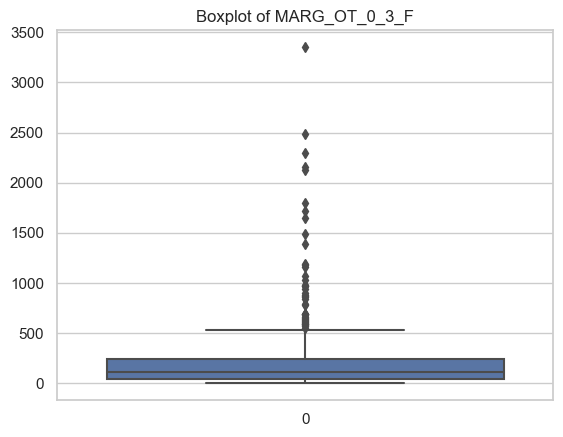

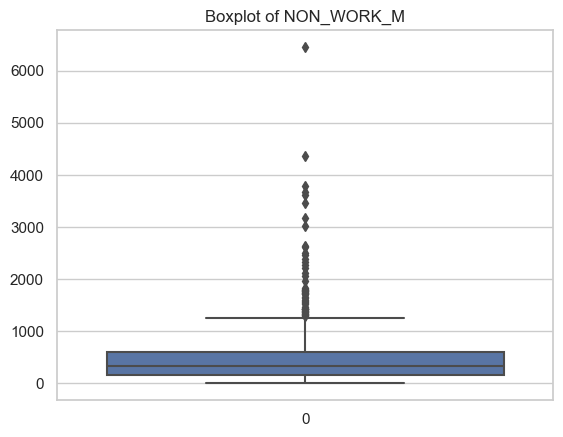

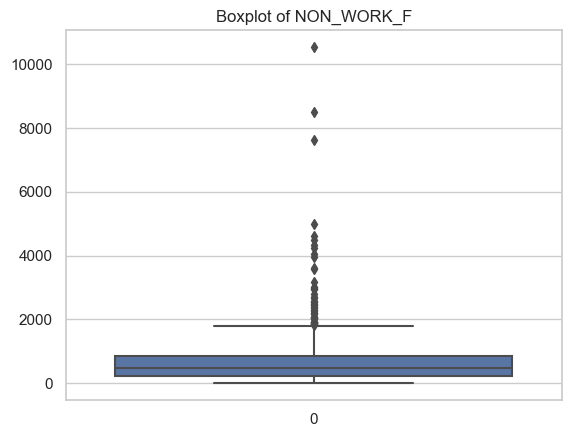

In [177]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_columns:
    sns.boxplot(data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

#### Treating Outlier using IQR Method

In [178]:
Q1 = data[numerical_columns].quantile(0.25)
Q3 = data[numerical_columns].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
for col in numerical_columns:
    data[col] = np.clip(data[col], lower_bound[col], upper_bound[col])

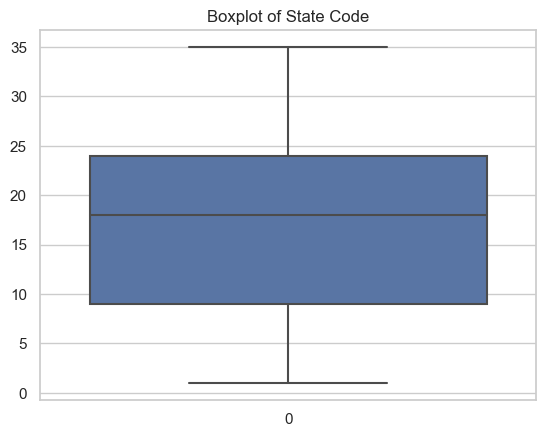

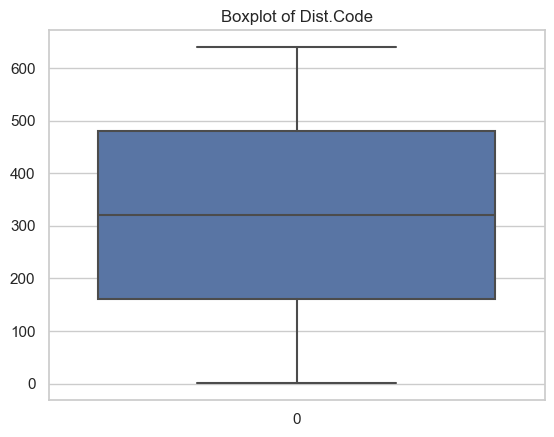

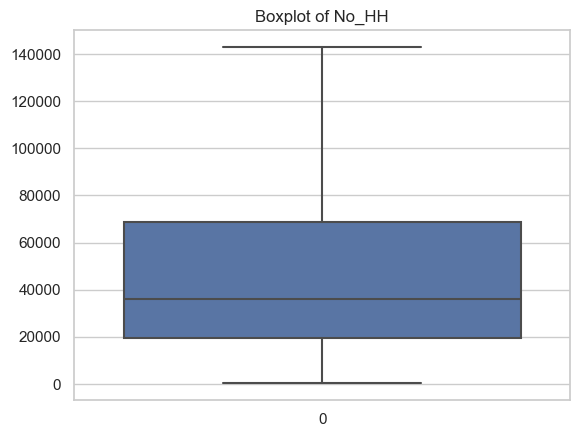

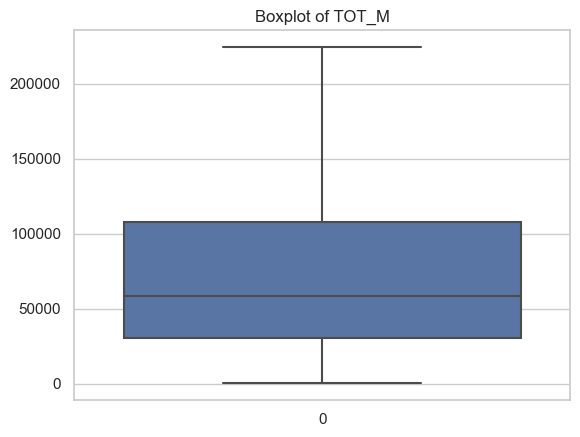

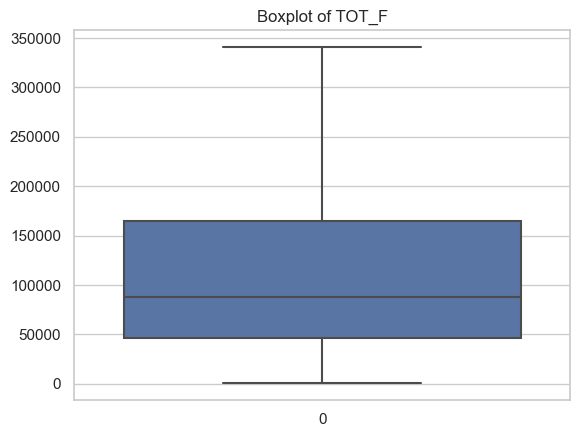

...

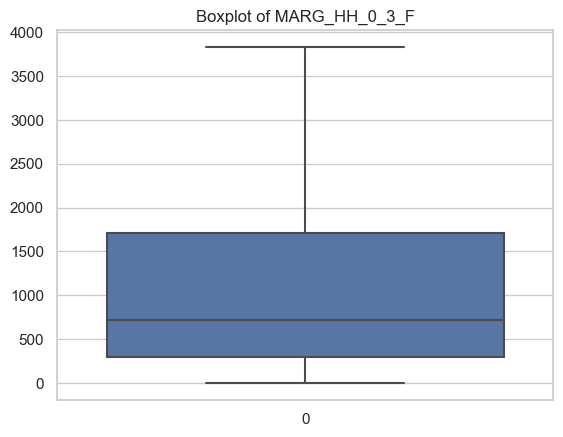

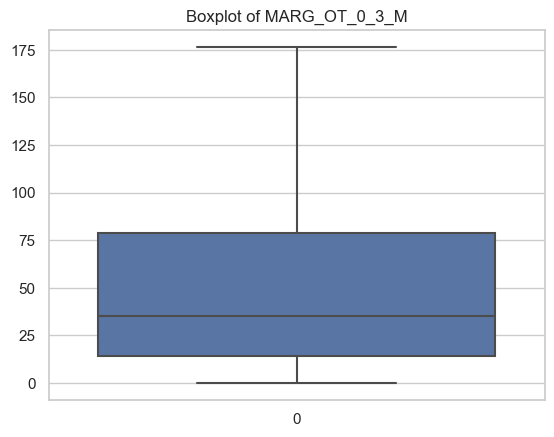

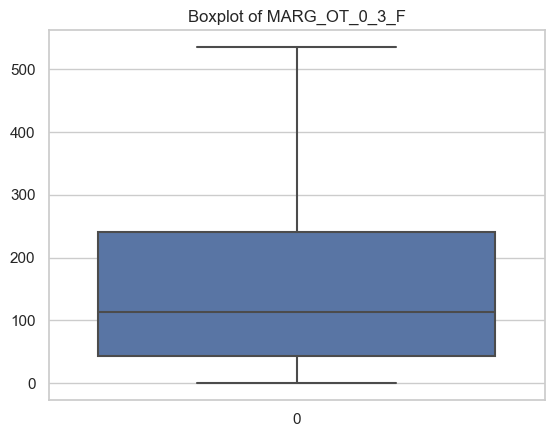

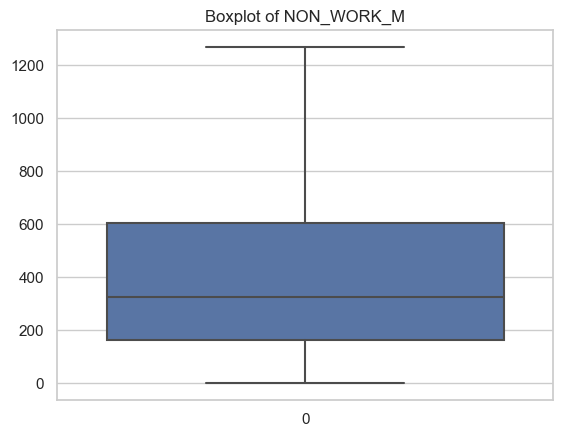

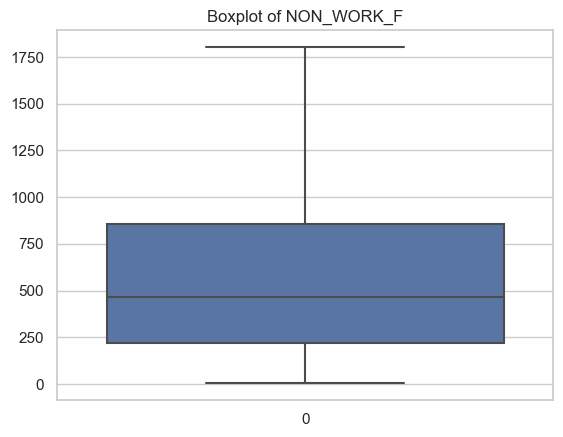

In [179]:
for col in numerical_columns:
    sns.boxplot(data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

#### Scale the Data using the z-score method

In [180]:
from sklearn.preprocessing import StandardScaler
data_scaled = data.copy()
scaler = StandardScaler()
scaler.fit(data_scaled[numerical_columns])

data_scaled[numerical_columns] = scaler.transform(data_scaled[numerical_columns])

data_scaled[numerical_columns].head()

,State Code,Dist.Code,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-1.710782,-1.729347,-1.038986,-0.874837,-0.937027,-0.624685,-0.561282,-1.080201,-1.079963,-0.510440,...,-0.093587,-0.860882,-0.041800,-0.423378,0.523468,-0.793688,-0.443385,-0.756991,-0.497493,-0.774865
1,-1.710782,-1.723934,-1.076896,-0.938023,-1.009723,-0.773932,-0.835657,-1.079873,-1.079635,-0.771833,...,-0.719169,-0.877096,-0.347040,-0.443790,-0.634478,-0.884805,0.358782,0.088391,-0.813235,-0.880662
2,-1.710782,-1.718521,-1.121858,-1.154665,-1.141539,-1.141642,-1.138104,-1.080201,-1.079635,0.122588,...,-1.130551,-1.128423,-0.770091,-0.800999,-1.063434,-0.984684,-1.026779,-1.025976,-1.008568,-1.074622
3,-1.710782,-1.713109,-1.201599,-1.217171,-1.214930,-1.197772,-1.176091,-1.080447,-1.079963,-0.399531,...,-1.050477,-1.100286,-0.679055,-0.701491,-1.039994,-0.970666,-0.953855,-0.987550,-0.877454,-1.078541
4,-1.710782,-1.707696,-0.938495,-0.921309,-0.935018,-0.700931,-0.740523,-1.078807,-1.078160,0.432534,...,-0.369844,-0.298617,1.484398,1.633130,-0.589942,-0.749882,-0.589234,-0.379131,-0.706204,-0.257637


#### Visualize the data before and after scaling and comment on the impact on outliers

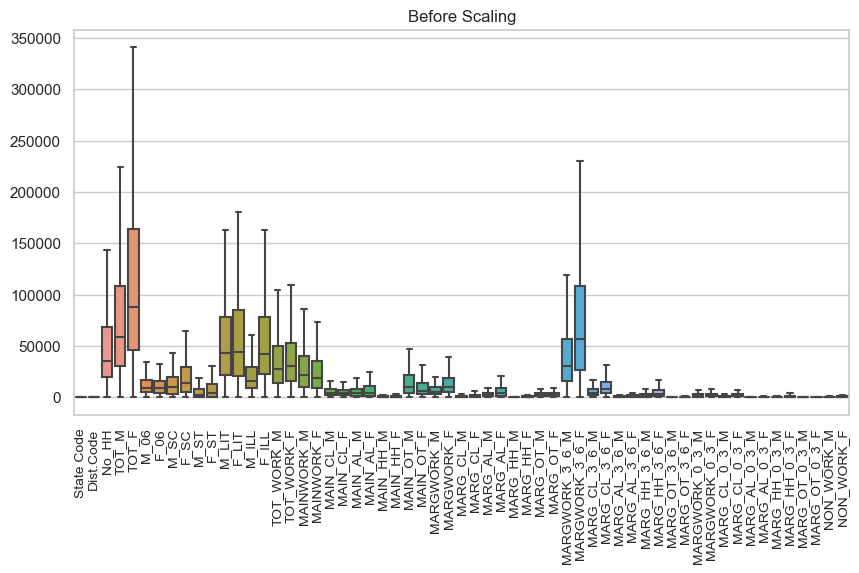

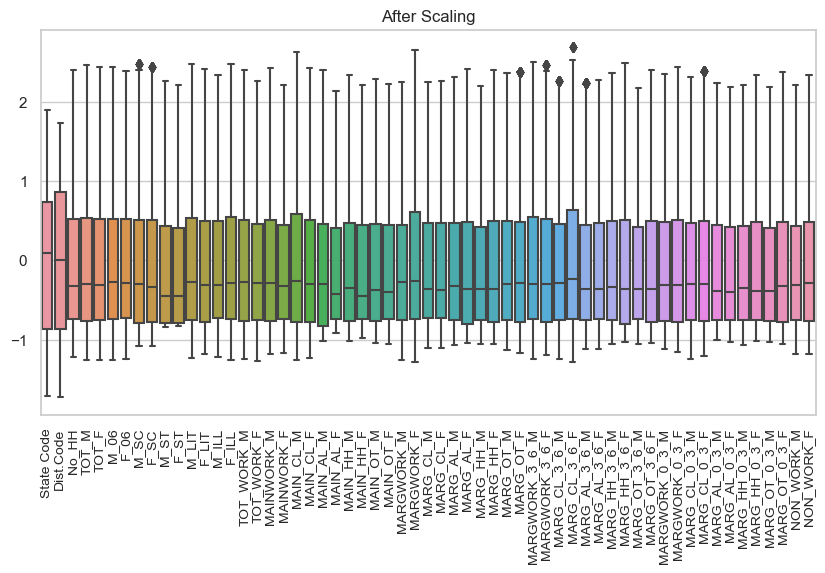

In [182]:
# Plot before scaling
plt.figure(figsize=(10, 5))
sns.boxplot(data=data[numerical_columns])
plt.title('Before Scaling')
plt.xticks(rotation=90, fontsize=10)
plt.show()

# Plot after scaling
plt.figure(figsize=(10, 5))
sns.boxplot(data=data_scaled[numerical_columns])
plt.title('After Scaling')
plt.xticks(rotation=90, fontsize=10)
plt.show()


#### Impact of scaling on outliers:
- Outliers are less pronounced after scaling.
- The distribution of each variable is more normal after scaling.
- This suggests that scaling can be an effective way to reduce the impact of outliers on downstream analyses.

## Problem 2 - PCA

#### Create the covariance matrix

In [105]:
covariance_matrix = data_scaled[numerical_columns].cov()
print(covariance_matrix)

                State Code  Dist.Code     No_HH     TOT_M     TOT_F      M_06  \
State Code        1.001565   0.994575  0.403382  0.160681  0.280228  0.042741   
Dist.Code         0.994575   1.001565  0.396349  0.159361  0.277952  0.048182   
No_HH             0.403382   0.396349  1.001565  0.912699  0.973013  0.812856   
TOT_M             0.160681   0.159361  0.912699  1.001565  0.980122  0.965044   
TOT_F             0.280228   0.277952  0.973013  0.980122  1.001565  0.914418   
M_06              0.042741   0.048182  0.812856  0.965044  0.914418  1.001565   
F_06              0.056849   0.063832  0.809883  0.960153  0.911167  0.999032   
M_SC              0.062688   0.055156  0.806713  0.877158  0.857664  0.833344   
F_SC              0.169715   0.162281  0.858562  0.861703  0.876435  0.796794   
M_ST              0.319385   0.313660  0.116300  0.023439  0.076189 -0.006081   
F_ST              0.333600   0.328743  0.122722  0.013301  0.074248 -0.021166   
M_LIT             0.213203  

#### Get eigen values and eigen vectors

In [108]:
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)

# Print eigen values
print('Eigen Values:')
print(eigen_values)
print("\n")
print('Eigen Vectors:')
print(eigen_vectors)

Eigen Values:
[3.57108475e+01 7.98557733e+00 4.50785903e+00 2.77867519e+00
 1.97472860e+00 1.17776767e+00 1.13039501e+00 7.22103375e-01
 4.64431676e-01 3.46774532e-01 3.05963732e-01 2.68366978e-01
 2.20811847e-01 1.80278141e-01 1.68296796e-01 1.32409265e-01
 1.29436740e-01 1.03406138e-01 9.55347371e-02 8.58417456e-02
 8.09066019e-02 6.56476263e-02 6.23708292e-02 4.79008765e-02
 4.56408231e-02 4.38435424e-02 3.10290046e-02 2.86009130e-02
 2.74987147e-02 2.33916183e-02 2.16432655e-02 1.87723745e-02
 1.56678899e-02 1.40371782e-02 1.18761437e-02 1.11316049e-02
 9.08077540e-03 7.25913797e-03 6.18691864e-03 4.89879738e-03
 4.55034891e-03 4.24001897e-03 3.26372660e-03 2.18239672e-03
 2.12902353e-03 1.90742071e-03 1.43490578e-03 1.09833856e-03
 9.62038195e-04 8.56614567e-04 6.51562449e-04 5.76295579e-04
 4.60548161e-05 8.95049889e-05 1.38262667e-04 2.07171377e-04
 4.31846786e-04 3.69015469e-04 3.06582238e-04]


Eigen Vectors:
[[-0.03036889 -0.17219661 -0.30134696 ...  0.02156452  0.00500425
  

#### Identify the optimum number of PCs

Note : - Taking 90% explained variance.

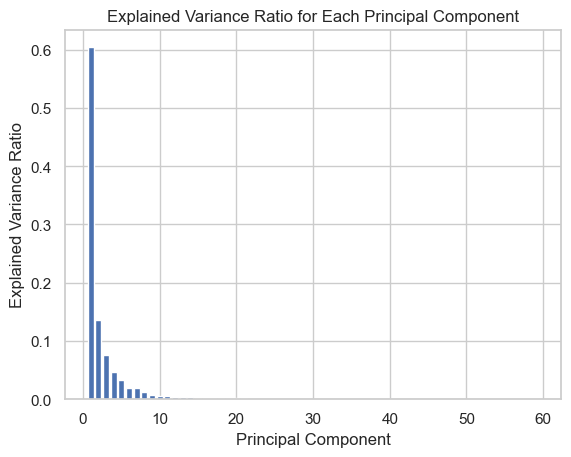

Number of PCs to explain at least 90% of the variance: 6


In [112]:
explained_variance_ratio = eigen_values / np.sum(eigen_values)

plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio for Each Principal Component')
plt.show()

cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)
num_pcs = (cumulative_explained_variance_ratio <= 0.90).sum() + 1

print(f'Number of PCs to explain at least 90% of the variance: {num_pcs}')

#### Show Scree plot

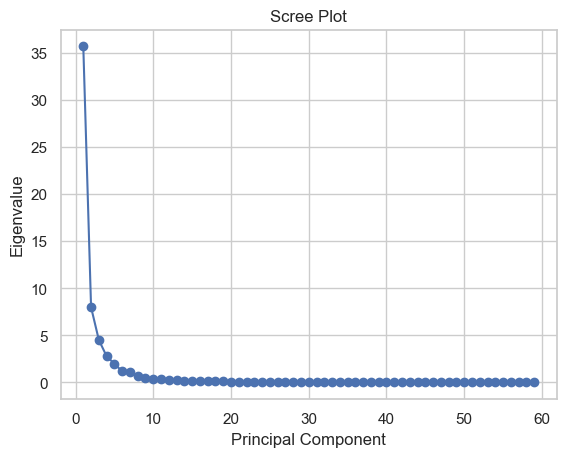

In [113]:
plt.plot(range(1, len(eigen_values) + 1), eigen_values, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot')
plt.show()

#### Compare PCs with Actual Columns and identify which is explaining most variance

In [121]:
loadings = eigen_vectors[:, :num_pcs]

loadings_df = pd.DataFrame(loadings, columns=[f'PC{i+1}' for i in range(num_pcs)], index=numerical_columns)
print(loadings_df)

                     PC1       PC2       PC3       PC4       PC5       PC6
State Code     -0.030369 -0.172197 -0.301347 -0.000705  0.150191  0.247414
Dist.Code      -0.030344 -0.169017 -0.306418  0.021726  0.134957  0.244015
No_HH          -0.149578 -0.119692 -0.068243 -0.079420 -0.027566 -0.030230
TOT_M          -0.159043 -0.070203  0.059847 -0.053010 -0.046639 -0.109570
TOT_F          -0.158310 -0.090756 -0.002988 -0.071231 -0.032287 -0.073523
M_06           -0.155991 -0.008429  0.083250 -0.027788 -0.077506 -0.139006
F_06           -0.156488 -0.003740  0.074635 -0.015675 -0.074457 -0.125977
M_SC           -0.143091 -0.065874  0.072860 -0.011447 -0.176436 -0.079702
F_SC           -0.143477 -0.079867  0.016494 -0.018471 -0.169565 -0.041946
M_ST           -0.019381  0.037398 -0.306361 -0.096905  0.331960 -0.134892
F_ST           -0.018442  0.034439 -0.319022 -0.085685  0.327077 -0.140749
M_LIT          -0.155137 -0.096793  0.055020 -0.089137 -0.017307 -0.091842
F_LIT          -0.145628 

In [126]:
# Compare the loadings to the actual columns to identify which PCs are explaining the most variance for each variable
for i in range(num_pcs):
    print(f'PC{i+1} explains the most variance for:')
    for j, column in enumerate(numerical_columns):
        if loadings_df.loc[column, f'PC{i+1}'] == loadings_df[f'PC{i+1}'].max():
            print(f'- {column}')

PC1 explains the most variance for:
- F_ST
PC2 explains the most variance for:
- MARG_AL_0_3_F
PC3 explains the most variance for:
- MAIN_HH_M
PC4 explains the most variance for:
- MARG_AL_M
PC5 explains the most variance for:
- M_ST
PC6 explains the most variance for:
- MARG_OT_3_6_F


In [127]:
# Identify the PC that is explaining the most variance overall
most_variance_explained_pc = np.argmax(eigen_values) + 1
print(f'PC{most_variance_explained_pc} is explaining the most variance overall.')

PC1 is explaining the most variance overall.


#### Write inferences about all the PCs in terms of actual variables

PC1:

- This component has negative loadings for most variables, indicating a general negative association.
- Variables with relatively higher negative loadings include No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F, MARGWORK_M, MARGWORK_F, MARG_CL_M, MARG_CL_F, MARG_AL_M, MARG_AL_F, MARG_HH_M, MARG_HH_F, MARG_OT_M, MARG_OT_F, MARGWORK_3_6_M, MARGWORK_3_6_F, MARG_CL_3_6_M, MARG_CL_3_6_F, MARG_AL_3_6_M, MARG_AL_3_6_F, MARG_HH_3_6_M, MARG_HH_3_6_F, MARG_OT_3_6_M, MARG_OT_3_6_F, MARGWORK_0_3_M, MARGWORK_0_3_F, MARG_CL_0_3_M, MARG_CL_0_3_F, MARG_AL_0_3_M, MARG_AL_0_3_F, MARG_HH_0_3_M, MARG_HH_0_3_F, MARG_OT_0_3_M, MARG_OT_0_3_F, NON_WORK_M, and NON_WORK_F.
- The negative loadings suggest that as this component increases, the values of these variables tend to decrease together.

PC2:

- This component also has negative loadings for most variables, but less extreme compared to PC1.
- Variables with relatively higher negative loadings include State Code, Dist.Code, No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F, MARGWORK_M, MARGWORK_F, MARG_CL_M, MARG_CL_F, MARG_AL_M, MARG_AL_F, MARG_HH_M, MARG_HH_F, MARG_OT_M, MARG_OT_F, MARGWORK_3_6_M, MARGWORK_3_6_F, MARG_CL_3_6_M, MARG_CL_3_6_F, MARG_AL_3_6_M, MARG_AL_3_6_F, MARG_HH_3_6_M, MARG_HH_3_6_F, MARG_OT_3_6_M, MARG_OT_3_6_F, MARGWORK_0_3_M, MARGWORK_0_3_F, MARG_CL_0_3_M, MARG_CL_0_3_F, MARG_AL_0_3_M, MARG_AL_0_3_F, MARG_HH_0_3_M, MARG_HH_0_3_F, MARG_OT_0_3_M, MARG_OT_0_3_F, NON_WORK_M, and NON_WORK_F.
- Similarly to PC1, the negative loadings indicate a tendency for variables to decrease together as this component increases.

PC3:

- This component shows a mix of positive and negative loadings.
- Variables with relatively higher loadings include M_ST, F_ST, MARG_AL_0_3_M, and MARG_AL_0_3_F.
- Positive loadings for M_ST and F_ST suggest a positive association between these variables and PC3, while negative loadings for MARG_AL_0_3_M and MARG_AL_0_3_F suggest a negative association.
- Positive loadings for M_ST and F_ST suggest that areas with higher proportions of scheduled tribe (ST) populations (both male and female) are positively associated with this component.
- Negative loadings for MARG_AL_0_3_M and MARG_AL_0_3_F suggest that areas with lower proportions of marginalized populations aged 0-3 (both male and female) are negatively associated with this component.

PC4:

- This component shows a mix of positive and negative loadings.
- Variables with relatively higher loadings include State Code, Dist.Code, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MARG_AL_M, MARG_AL_F, MARG_HH_M, MARG_HH_F, MARG_OT_M, and MARG_OT_F.
- Higher values on this component are associated with areas characterized by higher proportions of marginalized and non-marginalized workers across various sectors (male and female), along with higher proportions of households engaged in other types of work (male and female). Conversely, areas with lower values on this component are associated with lower proportions of these characteristics.

PC5:

- This component shows a mix of positive and negative loadings.
- Variables with relatively higher loadings include M_ST, F_ST, and MARG_HH_0_3_F.
- Higher values on this component are associated with areas with higher proportions of scheduled tribe (ST) populations (both male and female) and a higher proportion of households with children aged 0-3 (female). Conversely, areas with lower values on this component are associated with lower proportions of these characteristics.

PC6:

- This component shows a mix of positive and negative loadings.
- Variables with relatively higher loadings include PC1, PC2, TOT_F, and MAIN_OT_F.
- This component is influenced by multiple factors, including those captured in PC1, PC2, and specific variables related to total female population and main workers in other occupations (female). Higher values on this component may represent areas with a combination of characteristics reflected in these variables, while lower values may represent areas with fewer such characteristics.

In [133]:
pc1_loadings = loadings_df.loc[:, 'PC1']
variables_and_loadings = list(zip(numerical_columns, pc1_loadings))
linear_equation = 'PC1 = '
for variable, loading in variables_and_loadings:
    if loading >= 0:
        linear_equation += f'+ {loading:.3f} * {variable}'
    else:
        linear_equation += f'- {-loading:.3f} * {variable}'

print(linear_equation)

PC1 = - 0.030 * State Code- 0.030 * Dist.Code- 0.150 * No_HH- 0.159 * TOT_M- 0.158 * TOT_F- 0.156 * M_06- 0.156 * F_06- 0.143 * M_SC- 0.143 * F_SC- 0.019 * M_ST- 0.018 * F_ST- 0.155 * M_LIT- 0.146 * F_LIT- 0.154 * M_ILL- 0.158 * F_ILL- 0.154 * TOT_WORK_M- 0.143 * TOT_WORK_F- 0.142 * MAINWORK_M- 0.126 * MAINWORK_F- 0.111 * MAIN_CL_M- 0.083 * MAIN_CL_F- 0.120 * MAIN_AL_M- 0.091 * MAIN_AL_F- 0.142 * MAIN_HH_M- 0.134 * MAIN_HH_F- 0.123 * MAIN_OT_M- 0.117 * MAIN_OT_F- 0.156 * MARGWORK_M- 0.149 * MARGWORK_F- 0.087 * MARG_CL_M- 0.064 * MARG_CL_F- 0.127 * MARG_AL_M- 0.116 * MARG_AL_F- 0.145 * MARG_HH_M- 0.142 * MARG_HH_F- 0.151 * MARG_OT_M- 0.148 * MARG_OT_F- 0.158 * MARGWORK_3_6_M- 0.156 * MARGWORK_3_6_F- 0.157 * MARG_CL_3_6_M- 0.149 * MARG_CL_3_6_F- 0.094 * MARG_AL_3_6_M- 0.066 * MARG_AL_3_6_F- 0.128 * MARG_HH_3_6_M- 0.114 * MARG_HH_3_6_F- 0.145 * MARG_OT_3_6_M- 0.141 * MARG_OT_3_6_F- 0.151 * MARGWORK_0_3_M- 0.148 * MARGWORK_0_3_F- 0.142 * MARG_CL_0_3_M- 0.133 * MARG_CL_0_3_F- 0.062 * MARG_A